In [ ]:
from __future__ import print_function
import sys
sys.path.insert(0, '..')

import datetime

import pandas as pd
#from pathlib import Path
import torch
from torch import nn
from torch.optim import Adam

from torch.utils.data import random_split
from sound_dataset import SoundDS

from early_stopping import EarlyStopping

import cvae_model
import numpy as np

from torch.utils.tensorboard import SummaryWriter

import matplotlib.pyplot as plt; plt.rcParams['figure.dpi'] = 200


import librosa
import soundfile as sf

from sound_utility import AudioUtil

from sklearn.manifold import TSNE

from torch.nn import functional as F

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from tqdm import tqdm


In [ ]:
"""
https://zenodo.org/records/3685367
<FAMILY>/<INSTRUMENT>/ordinario/<INSTR>-ord-<PITCH>-<DYN>-<INSTANCE>-<MISC>.wav

Intensity Dynamics:
Forte: f, loud
Piano: p, soft
Mezzo-forte: mf, medium loud
Mezzo-piano: mp, medium soft
Fortissimo: ff, very loud
Pianissimo: pp, very soft
Crescendo: Gradually increasing in volume
Decrescendo: Gradually decreasing in volume

"""
#dataset = pd.read_csv('./../accordion345.csv')
#dataset = pd.read_csv('./../Violin.csv')
dataset = pd.read_csv('./../Strings.csv')
#dataset = pd.read_csv('./../TinySOL_metadata_updated.csv')

dataset['Full_Path'] = './../TinySOL/' + dataset['Path'].astype(str)
data = dataset[['Full_Path','Instance ID']]
data.head()


In [ ]:
dataset['Instance ID'].unique()

In [ ]:
#sr=44100, n_fft=2048, hop_length=512
myds = SoundDS(data, './',
               duration=1,
               sr=44100,
               #n_fft=2048,
               n_fft=8192,
               hop_len=512,
               label='Instance ID',
               cutoff=128,
               highpass=True
               )

#batch_size = 32
batch_size = 1


# Random split of 80:20 between training and validation
num_items = len(myds)
num_train = round(num_items * 0.8)
num_val = num_items - num_train
train_ds, val_ds = random_split(myds, [num_train, num_val])

# Create training and validation data loaders
train_dl = torch.utils.data.DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_dl = torch.utils.data.DataLoader(val_ds, batch_size=batch_size, shuffle=False)

if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available:
    device = torch.device("cuda")    
else:
    device = torch.device("cpu")

x = torch.ones(1, device=device)

print (x)




In [ ]:
len(train_ds)

In [ ]:
def one_hot(labels, class_size):
    targets = torch.zeros(labels.size(0), class_size)
    for i, label in enumerate(labels):
        targets[i, label] = 1
    return targets.to(device)

def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None):
  print(spec.shape)
  fig, axs = plt.subplots(1, 1)
  axs.set_title(title or 'Spectrogram (db)')
  axs.set_ylabel(ylabel)
  axs.set_xlabel('frame')
  im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect)
  if xmax:
    axs.set_xlim((0, xmax))
  fig.colorbar(im, ax=axs)
  plt.show(block=False)

def stft_for_reconstruction(x, fft_size, hopsamp):
    window = np.hanning(fft_size)
    fft_size = int(fft_size)
    hopsamp = int(hopsamp)
    return np.array([np.fft.rfft(window*x[i:i+fft_size])
                     for i in range(0, len(x)-fft_size, hopsamp)])


def istft_for_reconstruction(X, fft_size, hopsamp):
    fft_size = int(fft_size)
    hopsamp = int(hopsamp)
    window = np.hanning(fft_size)
    time_slices = X.shape[0]
    len_samples = int(time_slices*hopsamp + fft_size)
    x = np.zeros(len_samples)
    for n,i in enumerate(range(0, len(x)-fft_size, hopsamp)):
        x[i:i+fft_size] += window*np.real(np.fft.irfft(X[n]))
    return x
def reconstruct_signal_griffin_lim(magnitude_spectrogram, fft_size, hopsamp, iterations):
    time_slices = magnitude_spectrogram.shape[0]
    len_samples = int(time_slices*hopsamp + fft_size)
    # Initialize the reconstructed signal to noise.
    x_reconstruct = np.random.randn(len_samples)
    n = iterations # number of iterations of Griffin-Lim algorithm.
    rmse = []
    while n > 0:
        n -= 1
        reconstruction_spectrogram = stft_for_reconstruction(x_reconstruct, fft_size, hopsamp)
        reconstruction_angle = np.angle(reconstruction_spectrogram)
        # Discard magnitude part of the reconstruction and use the supplied magnitude spectrogram instead.
        proposal_spectrogram = magnitude_spectrogram*np.exp(1.0j*reconstruction_angle)
        prev_x = x_reconstruct
        x_reconstruct = istft_for_reconstruction(proposal_spectrogram, fft_size, hopsamp)
        diff = np.sqrt(sum((x_reconstruct - prev_x)**2)/x_reconstruct.size)
        rmse.append(diff)
    return x_reconstruct, rmse

364
torch.Size([1, 4097, 87])


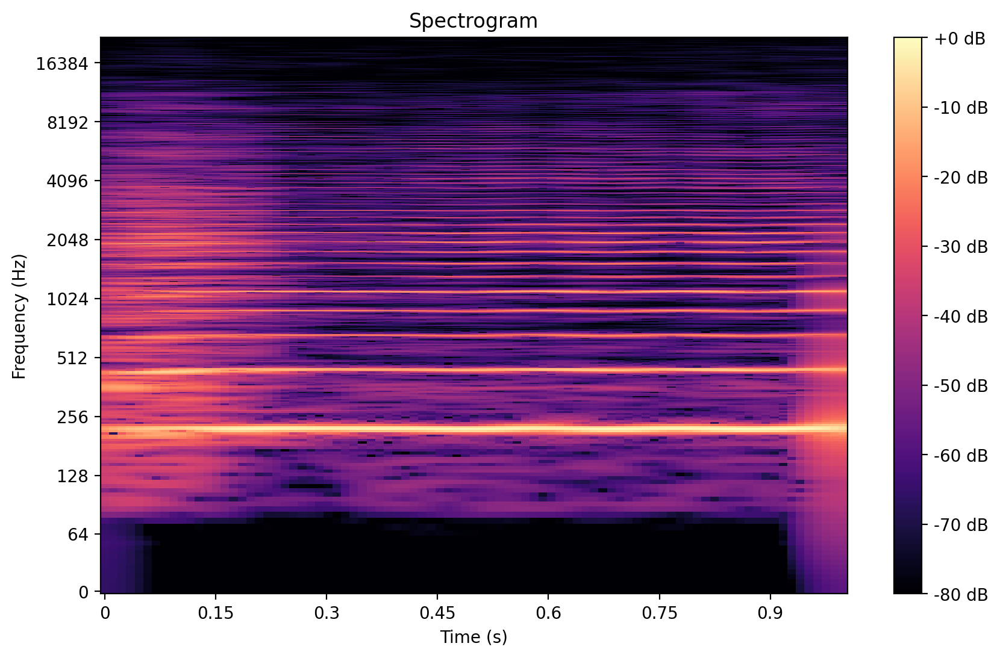

In [48]:
print(len(train_dl))
for batch_idx, (data,label) in enumerate(train_dl):

    print(data.shape)
    AudioUtil.plot_spectrogram(data[0])
    break    
#    print(label)
#    label = one_hot(label, 4)
#    print(label[0])



In [40]:
# Spectrograms are two-dimensional arrays 
# where one axis represents time and the other represents frequency

# in mnist this is 28x28.. for the spectrograms it would be 1025x431
#x_dim = 1025*431 # for 5 seconds -> 441775
#x_dim = 1025*259 # number of input features for 3 seconds -> 265475
x_dim = 4097*87
hidden_dim = 300 # number of neurons in the hidden layer
latent_dim = 50 # number of features tu learn
class_size = 4

# increasing the latent dimensions seems to increase the 'volume' of the sounds, they sound clear
# with 50 its not too loud, I perceived the instrument but it has some noise
# with 100 the sound was louder and not so noisy (like white noise combined with the note)
# stick with 100 for now

model = cvae_model.CVAE(input_dim=x_dim, hidden_dim=hidden_dim, latent_dim=latent_dim, class_size = class_size).to(device)

print(model)

CVAE(
  (fc1): Linear(in_features=356443, out_features=300, bias=True)
  (fc21): Linear(in_features=300, out_features=50, bias=True)
  (fc22): Linear(in_features=300, out_features=50, bias=True)
  (fc3): Linear(in_features=54, out_features=300, bias=True)
  (fc4): Linear(in_features=300, out_features=356439, bias=True)
)


In [41]:

# The training function for early stopping runs but the 100 epochs 

# Reconstruction + KL divergence losses summed over all elements and batch
def l1_loss_function(recon_x, x, mu, logvar):
    # MSE and KLD have different scales
    # Take into account that this VAE produces a huge output
    
    
    criterion = nn.L1Loss()
    #criterion = nn.MSELoss(reduction='sum')
    
    loss = criterion(recon_x, x.view(-1, x_dim))
    
    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    
    return loss #+ KLD

def mse_loss_function(recon_x, x, mu, logvar):
    # MSE and KLD have different scales
    # Take into account that this VAE produces a huge output
    
    criterion = nn.MSELoss(reduction='sum')
    
    loss = criterion(recon_x, x.view(-1, x_dim))
    
    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    
    return loss + KLD

In [42]:
# Train with early stopping

log_interval = 10

lr = 0.0001

optimizer = Adam(model.parameters(), lr=lr)


def train_es(epochs, patience = 10, lf='mse'):

    # Writer will output to ./runs/ directory by default
    logdir = './runs/'+lf+'_kld_es_ ' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    writer = SummaryWriter(logdir)

    early_stopping = EarlyStopping(patience=patience, verbose=True)

    for epoch in range(1, epochs + 1):

        model.train()
        train_loss = 0

        for batch_idx, (spectrogram,label) in enumerate(train_dl):

            #scipy works with cpu when applying the highpass filter
            spectrogram_tensor = spectrogram.to(dtype=torch.float32)
            #print("spectrogram tensor:",spectrogram_tensor.shape)

            label = label.to(device)
            data = spectrogram_tensor.to(device)
            label = one_hot(label, class_size) # class number, not sure yet 

            optimizer.zero_grad()

            recon_batch, mu, logvar = model(data,label[0])
            
            # recon_batch is prediction, data is ground_truth        
            #criterion is for l1 or mse
            #loss = criterion(recon_batch, data.view(-1, x_dim))
            if lf == 'l1':
                loss = l1_loss_function(recon_batch, data, mu, logvar)
            elif lf == 'mse':
                loss = mse_loss_function(recon_batch, data, mu, logvar)

            loss.backward()

            train_loss += loss.item()
            writer.add_scalar('Loss/train', train_loss, epoch)
            optimizer.step()
            
            if batch_idx % log_interval == 0:
                print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.4f}'.format(
                    epoch, batch_idx * len(data), len(train_dl.dataset),
                    100. * batch_idx / len(train_dl), loss.item()))

        print('====> Epoch: {} Average loss: {:.4f}'.format(
            epoch, train_loss / len(train_dl.dataset)))


        """if batch_idx % log_interval == 0:
                print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    epoch, batch_idx * len(data), len(train_dl.dataset),
                    100. * batch_idx / len(train_dl),
                    loss.item() / len(data)))

        print('====> Epoch: {} Average loss: {:.4f}'.format(
            epoch, train_loss / len(train_dl.dataset)))"""

        # Validation
        model.eval()
        val_loss = 0

        with torch.no_grad():

            for i, (spectrogram,labels) in enumerate(val_dl):
                float32_tensor = spectrogram.to(dtype=torch.float32)
                data, labels = float32_tensor.to(device),labels.to(device)
                labels = one_hot(labels, class_size) # 

                recon_batch, mu, logvar = model(data,labels[0])
                
                #val_loss += criterion(recon_batch, data[0]) #.item()
                if lf == 'l1':
                    val_loss += l1_loss_function(recon_batch, data, mu, logvar).item()

                elif lf == 'mse':
                    val_loss += mse_loss_function(recon_batch, data, mu, logvar).item()

                #val_loss += loss_function(recon_batch, data, mu, logvar).item()

                #val_loss = criterion(recon_batch, data.view(-1, x_dim))
                
                #spec = recon_batch.squeeze().cpu().numpy()

                #AudioUtil.plot_spectrogram(spec)

                #x_rec, rmse = reconstruct_signal_griffin_lim(mag_subset.T, 2048, 512, 30)
                #x_rec, rmse = reconstruct_signal_griffin_lim(spec.T, 2048, 512, 30)            

                #sf.write(f'./reconstructed_violin_high_pass/test_reconst_{i}.wav', x_rec, 44100)
                
                #sf.write(f'./reconstructed_accordion/test_reconst_{i}.wav', x_rec, 44100)

        #val_loss /= len(val_dl.dataset)

        # Calculate average losses
        train_loss /= len(train_dl.dataset)
        val_loss /= len(val_dl.dataset)
        
        print('====> Test set loss: {:.4f}'.format(val_loss))

        early_stopping(val_loss)

        if early_stopping.early_stop:
            print("Early stopping")
            break

    writer.close()



In [43]:
#train the model, use l1 or mse for different loss functions

patience = 3
epochs=100

#print('l1')
#train_es(epochs, patience,lf='l1')

#mse is the best (in terms of sound)
print('mse')
train_es(epochs, patience,lf='mse')



mse
Train Epoch: 1 [0/364 (0%)]	Loss: 93183.1094
Train Epoch: 1 [10/364 (3%)]	Loss: 2526233.0000
Train Epoch: 1 [20/364 (5%)]	Loss: 97015.8438
Train Epoch: 1 [30/364 (8%)]	Loss: 93564.4062
Train Epoch: 1 [40/364 (11%)]	Loss: 76027.6484
Train Epoch: 1 [50/364 (14%)]	Loss: 93462408.0000
Train Epoch: 1 [60/364 (16%)]	Loss: 73693.6406
Train Epoch: 1 [70/364 (19%)]	Loss: 71054.2656
Train Epoch: 1 [80/364 (22%)]	Loss: 4236799.0000
Train Epoch: 1 [90/364 (25%)]	Loss: 60337.3398
Train Epoch: 1 [100/364 (27%)]	Loss: 446302.1562
Train Epoch: 1 [110/364 (30%)]	Loss: 48669.9492
Train Epoch: 1 [120/364 (33%)]	Loss: 420096.0625
Train Epoch: 1 [130/364 (36%)]	Loss: 52552.6172
Train Epoch: 1 [140/364 (38%)]	Loss: 1035016960.0000
Train Epoch: 1 [150/364 (41%)]	Loss: 42108.3125
Train Epoch: 1 [160/364 (44%)]	Loss: 29433.0254
Train Epoch: 1 [170/364 (47%)]	Loss: 199947.2969
Train Epoch: 1 [180/364 (49%)]	Loss: 29433.6094
Train Epoch: 1 [190/364 (52%)]	Loss: 2789096.0000
Train Epoch: 1 [200/364 (55%)]	Los

100%|█████████▉| 363/364 [00:04<00:00, 75.28it/s]


<Axes: xlabel='x', ylabel='y'>

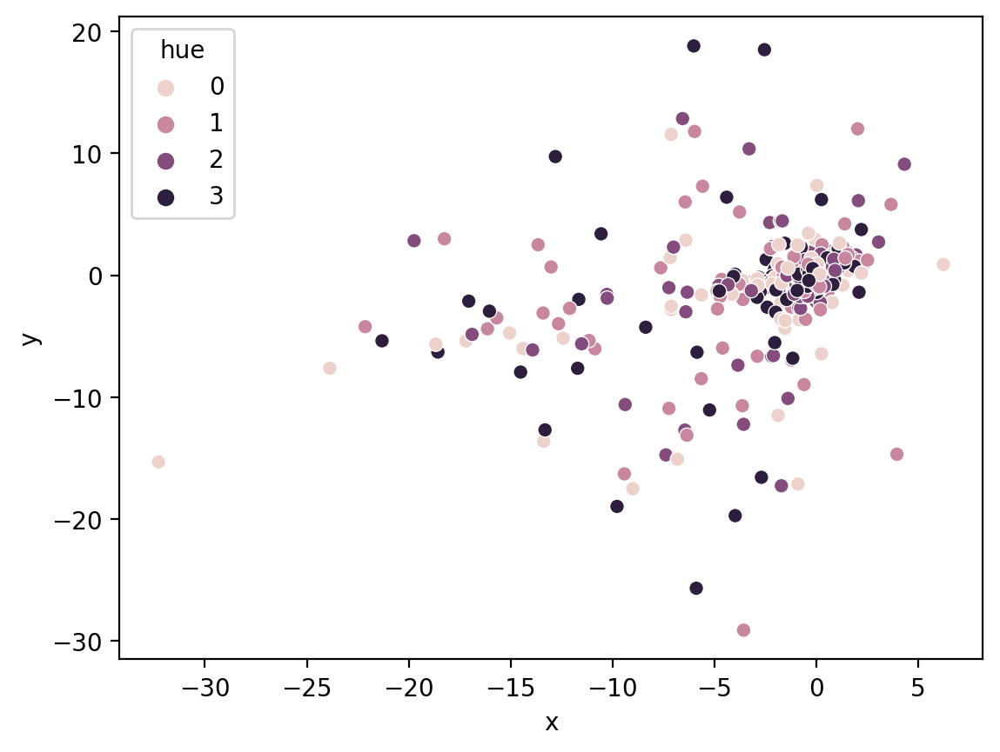

In [44]:
## Plot Latent Space
data = []
data_mu = []
data_logvar = []
targets = []

n_samples = int(len(train_ds))
counter = 0

class_size=4
#x_dim = 1025*259
x_dim = 4097*87
for spectrogram, labels in tqdm(train_dl):
#for batch_idx, (spectrogram, labels) in enumerate(train_dl):

  float32_tensor = spectrogram.to(dtype=torch.float32)
  spec_data, labels_enc = float32_tensor.to(device),labels.to(device)
  labels_enc = one_hot(labels_enc, class_size) # 

  spec_data = spec_data.view(-1, x_dim)

  mu, logvar = model.encode(spec_data,labels_enc[0])

  z = model.reparameterize(mu, logvar).detach().cpu().numpy()
  
  for x, y in zip(z, labels):
    data.append(x)
    targets.append(y)
    counter += 1

  if counter >= n_samples:
    break

data = np.array(data)
targets = np.array(targets)

df = pd.DataFrame({"x":data[:, 0], "y":data[:,1], "hue":targets})
sns.scatterplot(x="x", y="y", hue="hue", data=df, legend='full')

In [45]:
# use test with validation set to reconstruct data

sys.path.insert(0, '.')

def test(epoch,val_dl, lf='l1'):
    model.eval()
    test_loss = 0

    with torch.no_grad():
        for i, (spectrogram, labels) in enumerate(val_dl):
            float32_tensor = spectrogram.to(dtype=torch.float32)
            data, labels = float32_tensor.to(device),labels.to(device)
            labels = one_hot(labels, class_size) # 

            recon_batch, mu, logvar = model(data, labels[0])
            print('recon_batch:',recon_batch.shape)
            #print('label:',labels[0])

            #test_loss += criterion(recon_batch, data) #.item()
            if lf == 'l1':
                test_loss += l1_loss_function(recon_batch, data, mu, logvar).item()
            elif lf== 'mse':
                test_loss += mse_loss_function(recon_batch, data, mu, logvar).item()
            #if i==0:
                #print(spec.shape)
                #1025, 431
            spec = recon_batch.squeeze().cpu().numpy()
            print('spec prev reshape:',spec.shape)
            #spec = recon_batch.view(batch_size, 1, 1025, 431).squeeze().cpu().numpy()
            
            #spec = recon_batch.view(batch_size, 1, 1025, 259).squeeze().cpu().numpy()
            
            spec = recon_batch.view(batch_size, 1, 4097, 87).squeeze().cpu().numpy()

            print('spec reshape:',spec.shape)
            print('spec to plot:',spec.shape)
            AudioUtil.plot_spectrogram(spec)
            print(spec[-1].shape)

            #x_rec, rmse = reconstruct_signal_griffin_lim(mag_subset.T, 2048, 512, 30)
            4097, 87
            #x_rec, rmse = reconstruct_signal_griffin_lim(spec.T, 2048, 512, 30)            

            #x_rec, rmse = reconstruct_signal_griffin_lim(spec.T, 8192, 512, 30)            
            
            x_rec, rmse = reconstruct_signal_griffin_lim(spec.T, 8192, 512, 30)            


            #sf.write(f'./reconstructed_accordion/test_reconst_{i}.wav', x_rec, 44100)
            print(x_rec)
            sf.write(f'./reconstructed/test_reconst_{i}.wav', x_rec, 44100)

    test_loss /= len(val_dl.dataset)
    print('====> Test set loss: {:.4f}'.format(test_loss))


recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


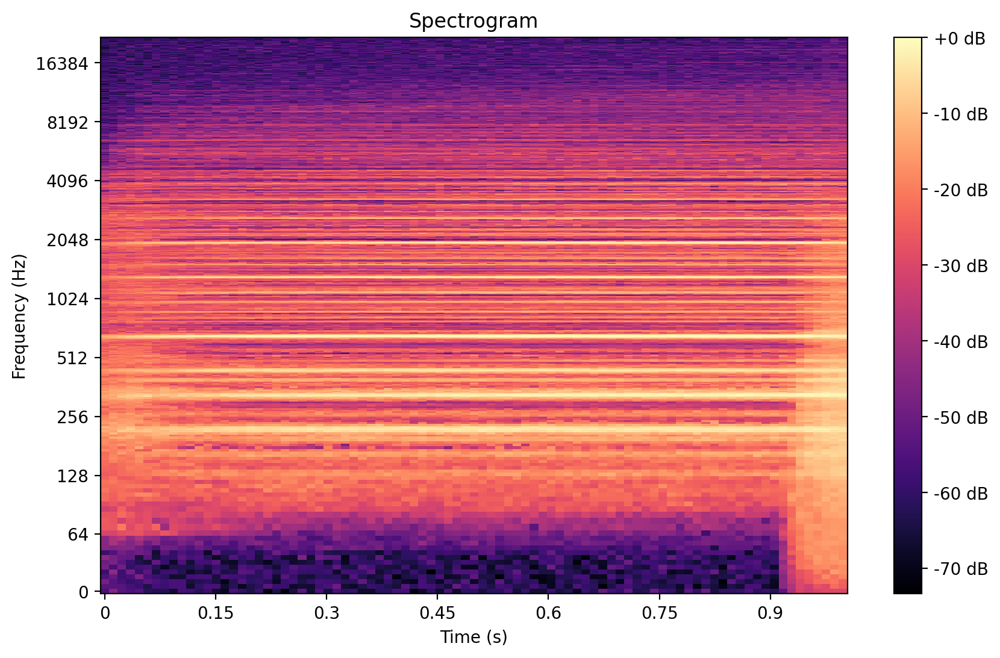

(87,)
[0.00000000e+00 1.38686393e-11 5.53677856e-11 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


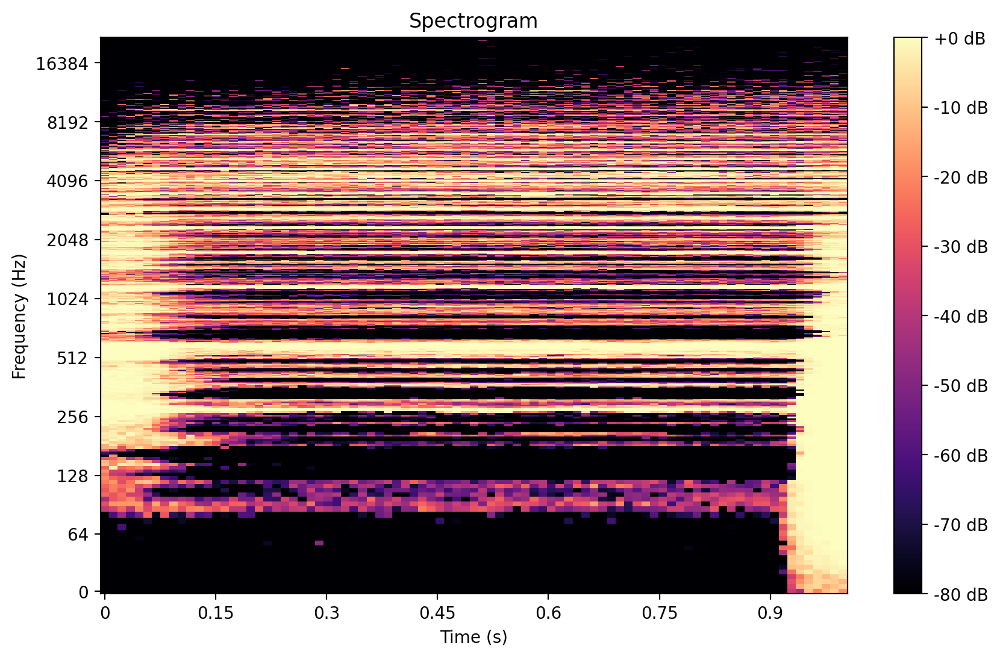

(87,)
[ 0.00000000e+00 -4.84499012e-11  8.20903931e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


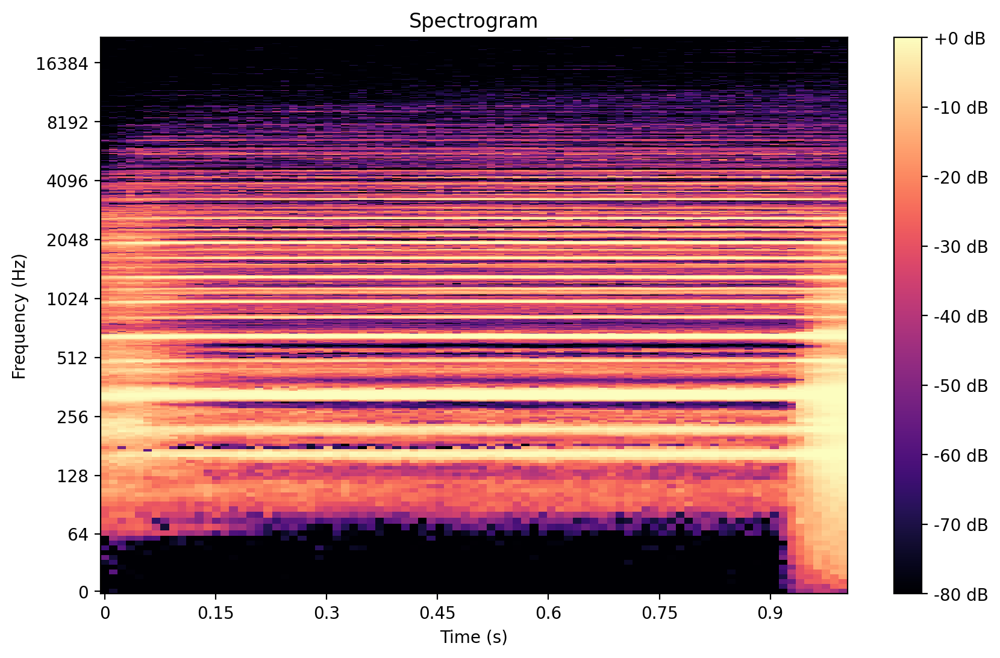

(87,)
[ 0.00000000e+00 -4.79009416e-11 -1.89007151e-10 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


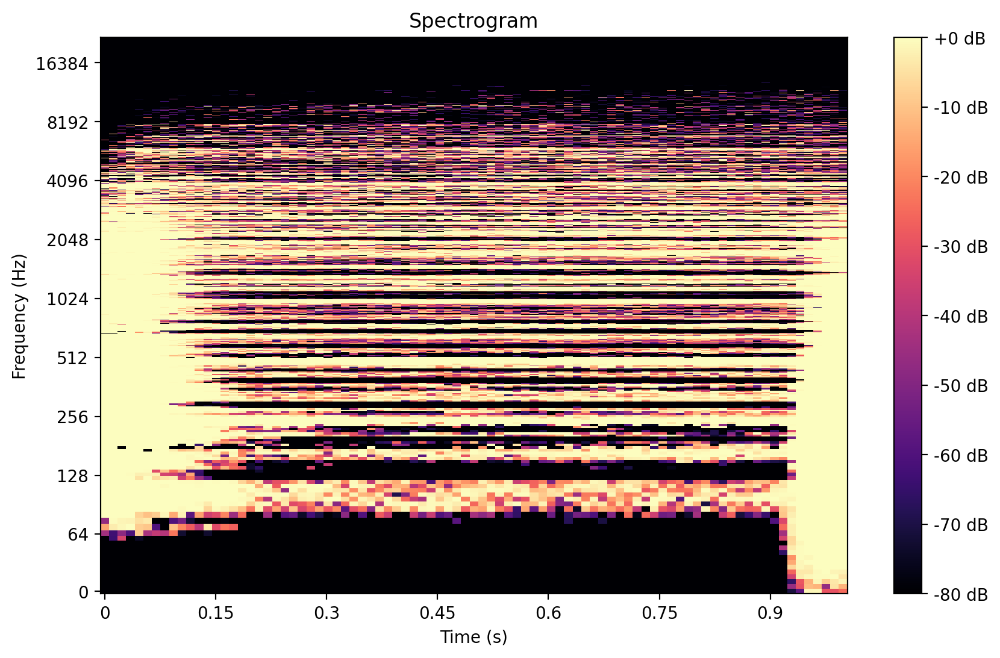

(87,)
[0.00000000e+00 1.26525079e-10 2.64278485e-11 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


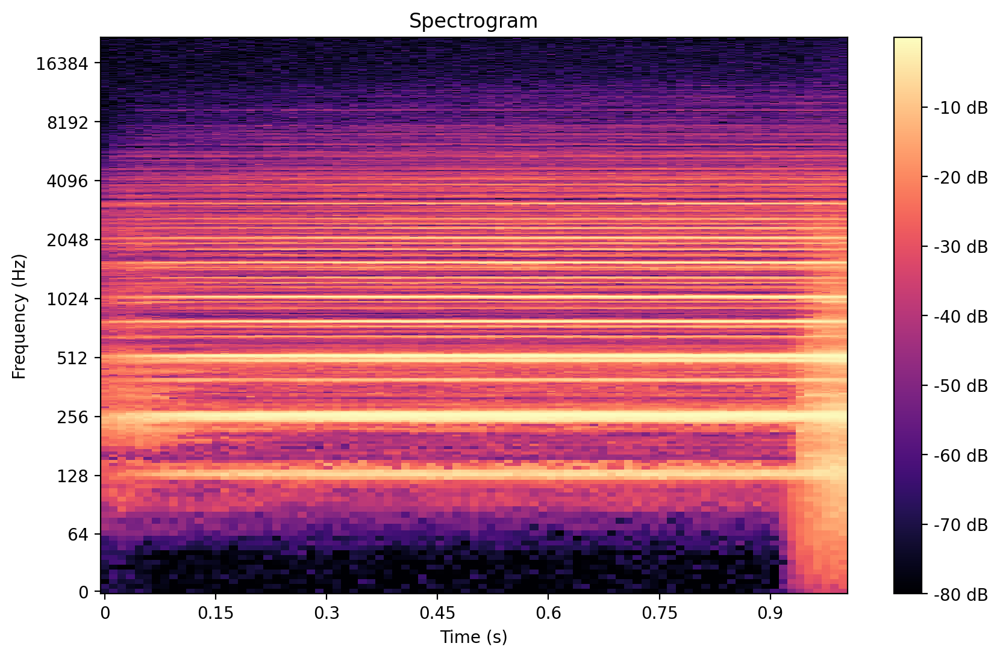

(87,)
[ 0.00000000e+00 -1.14589371e-11 -3.83539566e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


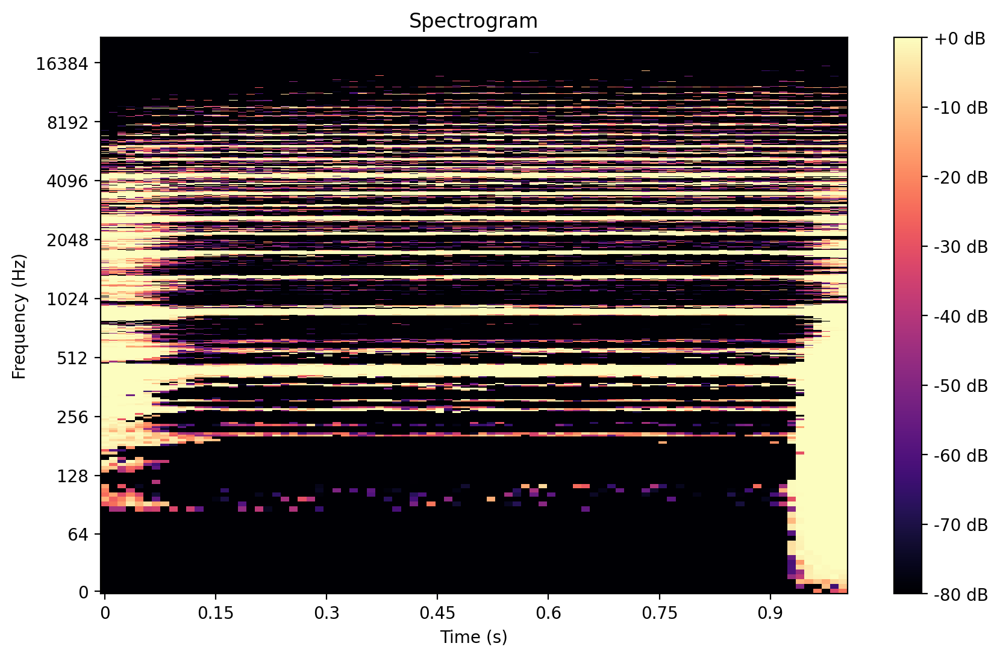

(87,)
[ 0.00000000e+00 -1.79684379e-11  7.19657056e-10 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


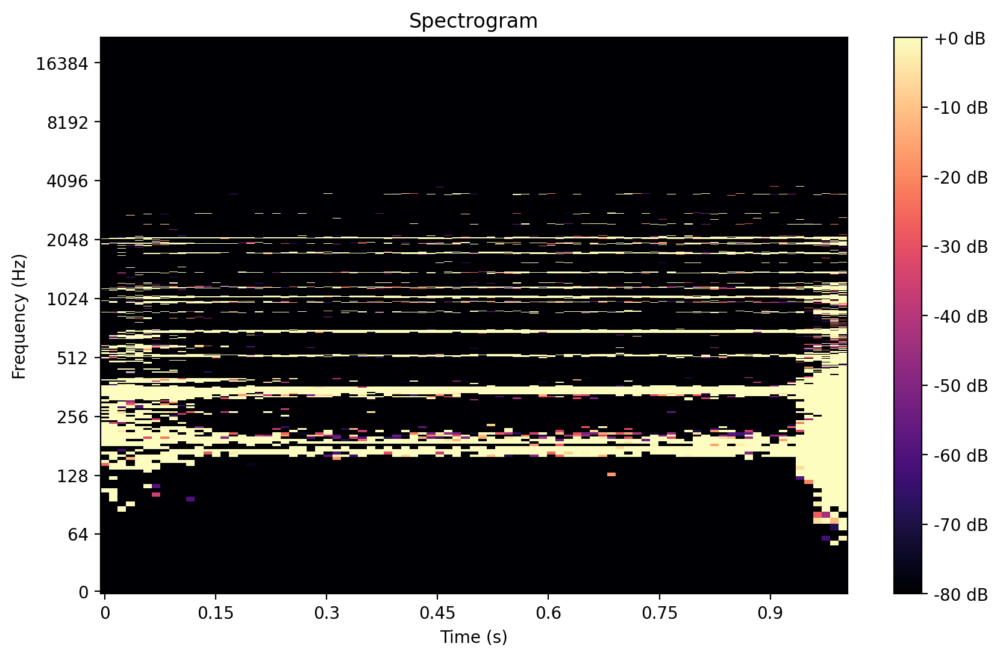

(87,)
[0.00000000e+00 9.92465860e-11 4.16851478e-10 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


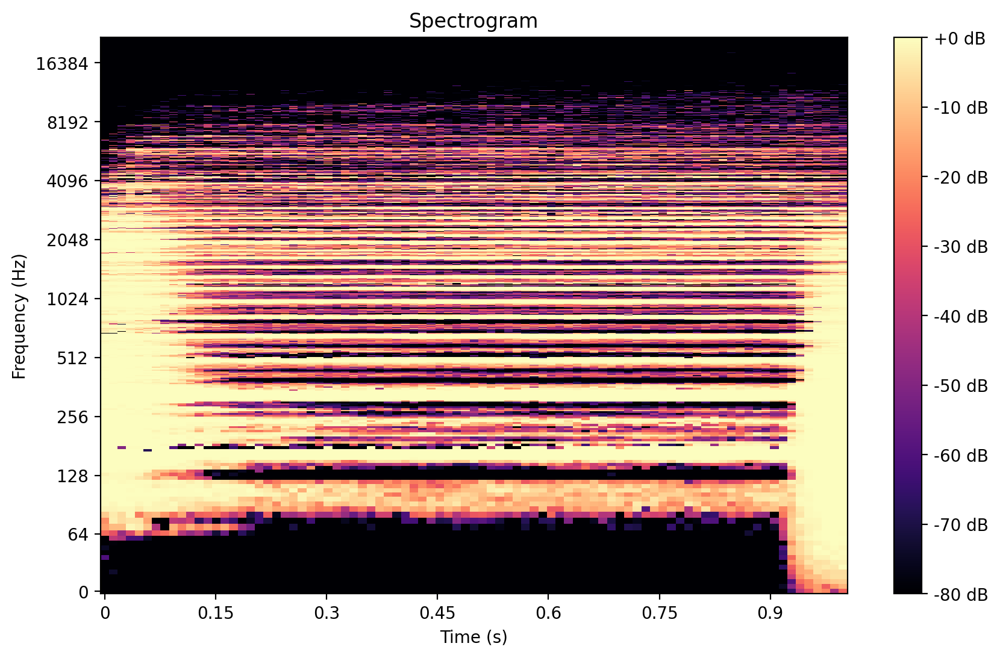

(87,)
[0.00000000e+00 8.18859356e-11 2.08496433e-10 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


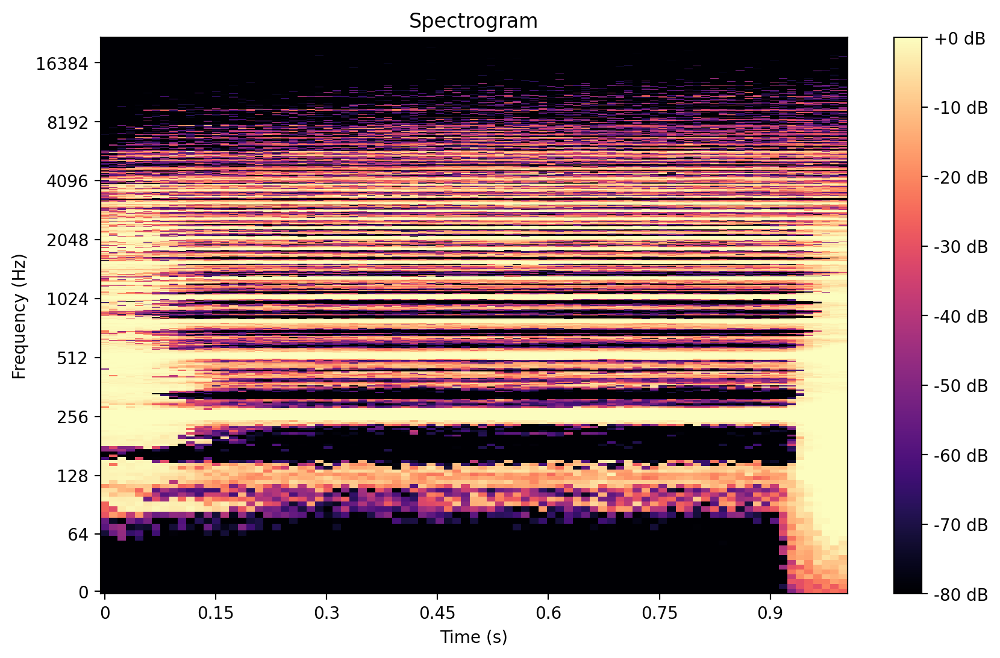

(87,)
[0.00000000e+00 4.87318823e-11 9.19870580e-11 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


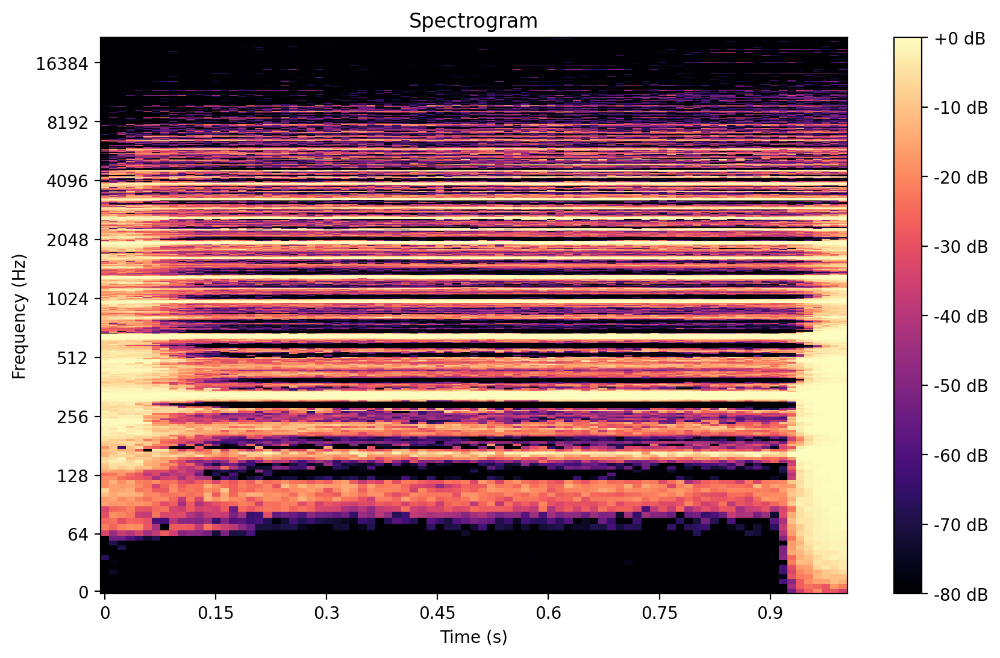

(87,)
[0.00000000e+00 6.93696982e-11 2.10759063e-10 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


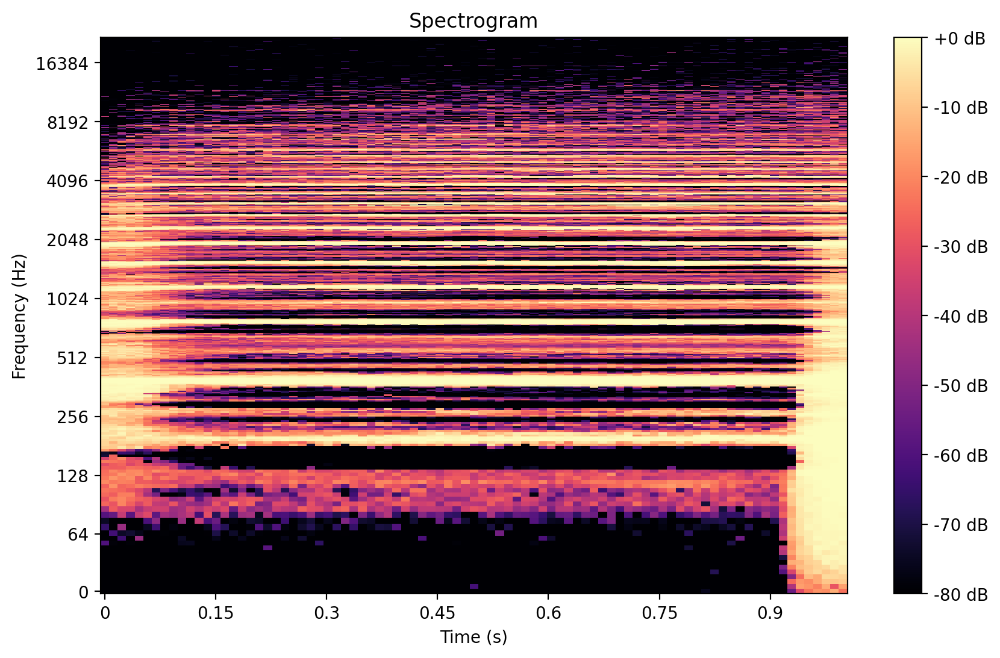

(87,)
[0.00000000e+00 4.69647698e-11 2.22937836e-10 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


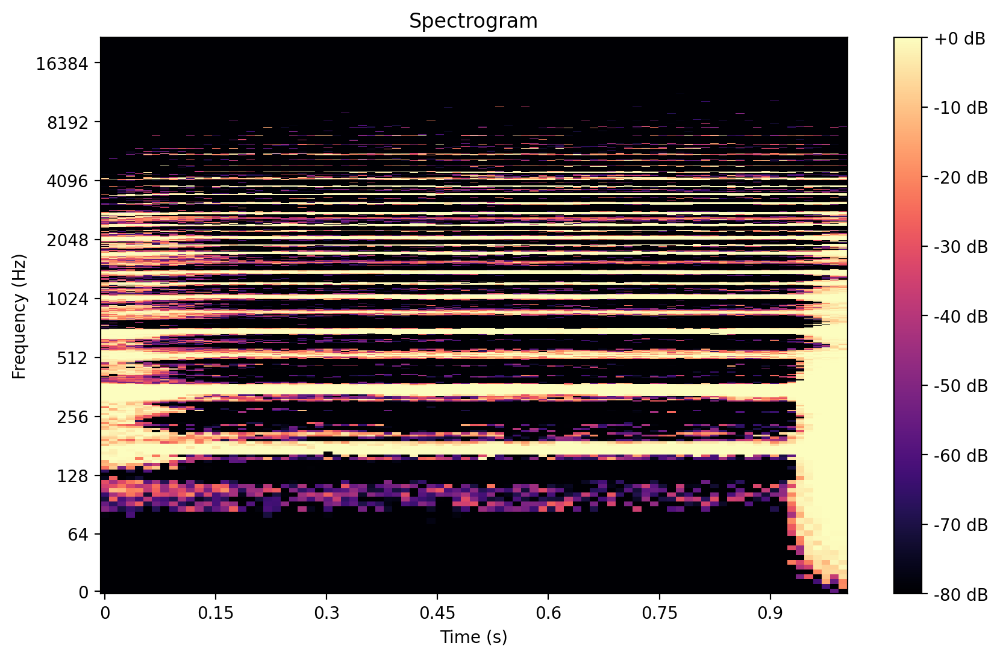

(87,)
[0.00000000e+00 2.97415726e-11 2.77049307e-10 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


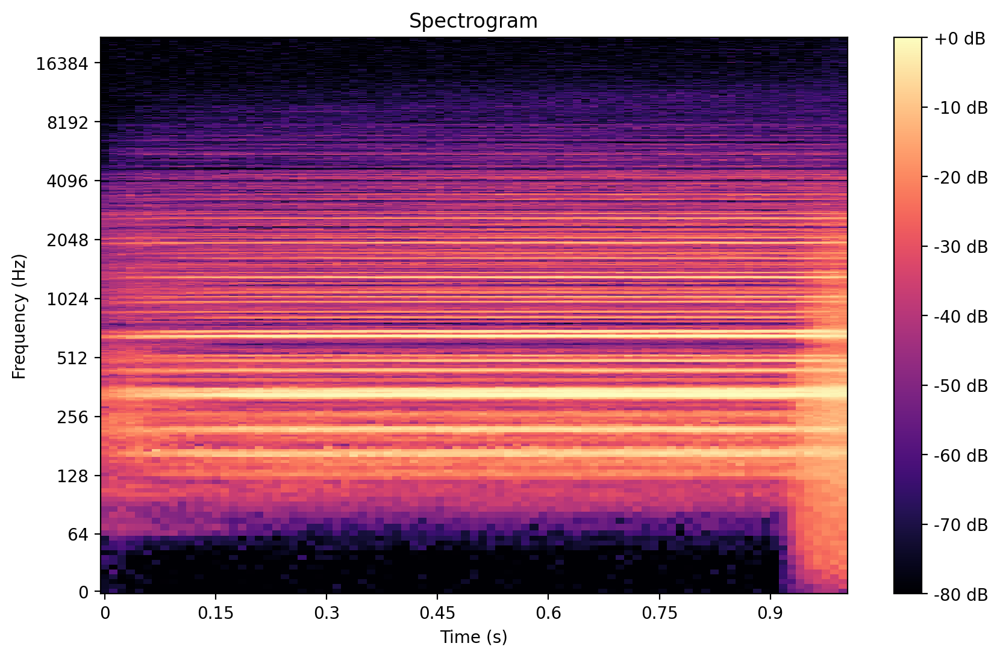

(87,)
[0.00000000e+00 8.87056194e-13 5.71618773e-12 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


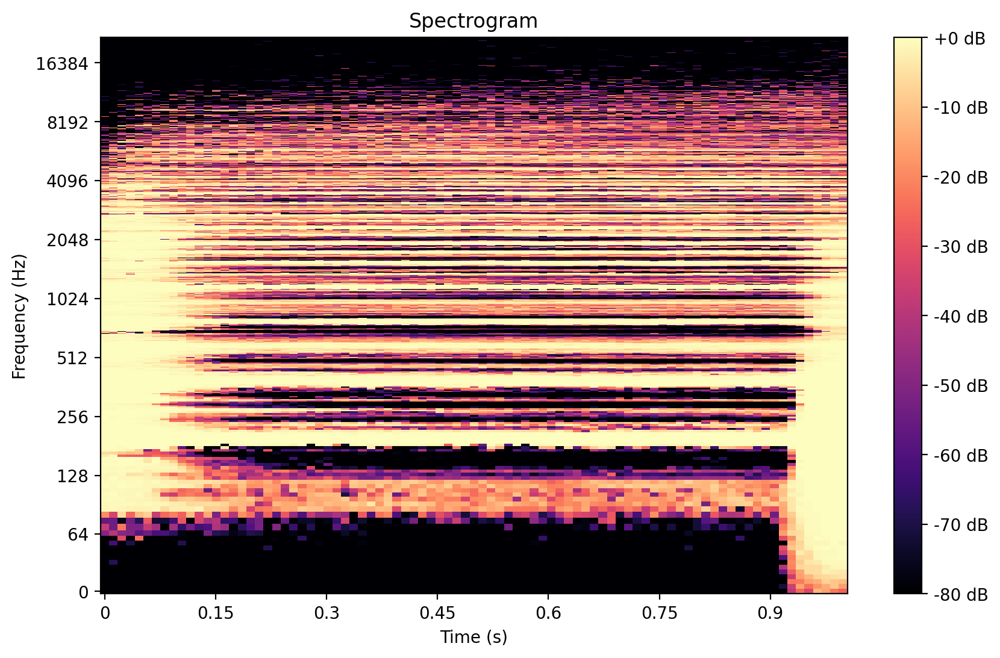

(87,)
[ 0.00000000e+00 -4.03029842e-11 -5.62354149e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


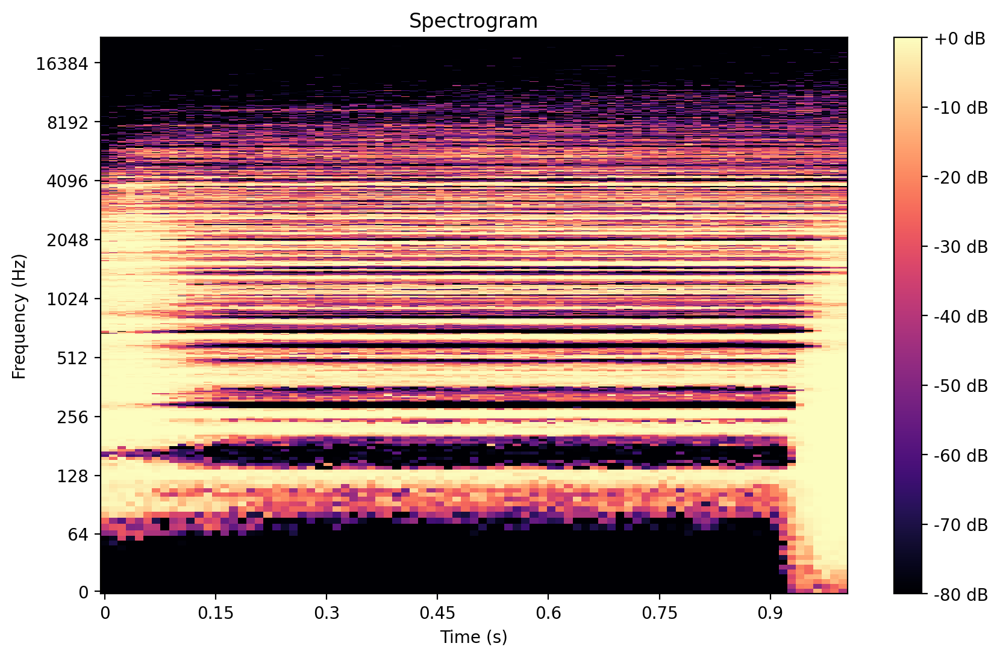

(87,)
[0.00000000e+00 1.52700156e-10 2.01079915e-10 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


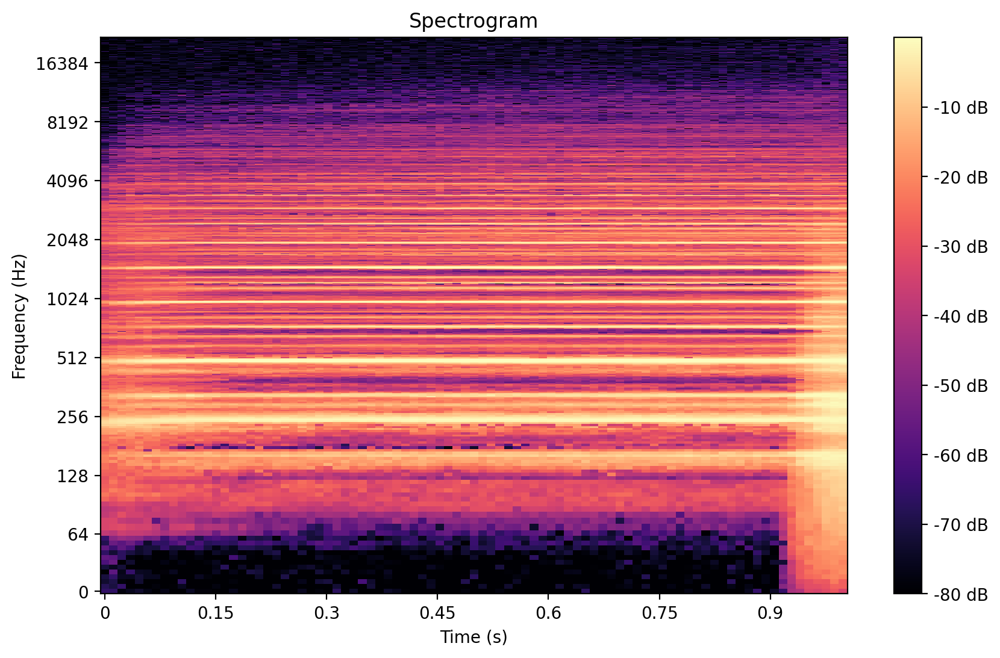

(87,)
[ 0.00000000e+00 -9.08072850e-12 -4.10871584e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


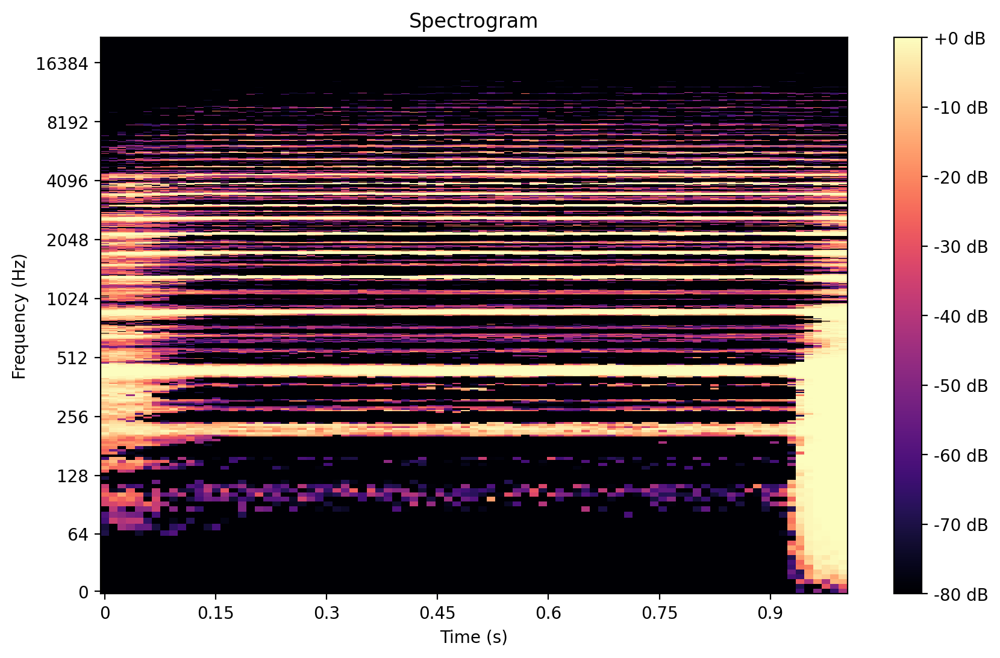

(87,)
[0.00000000e+00 1.07566071e-10 4.06002905e-10 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


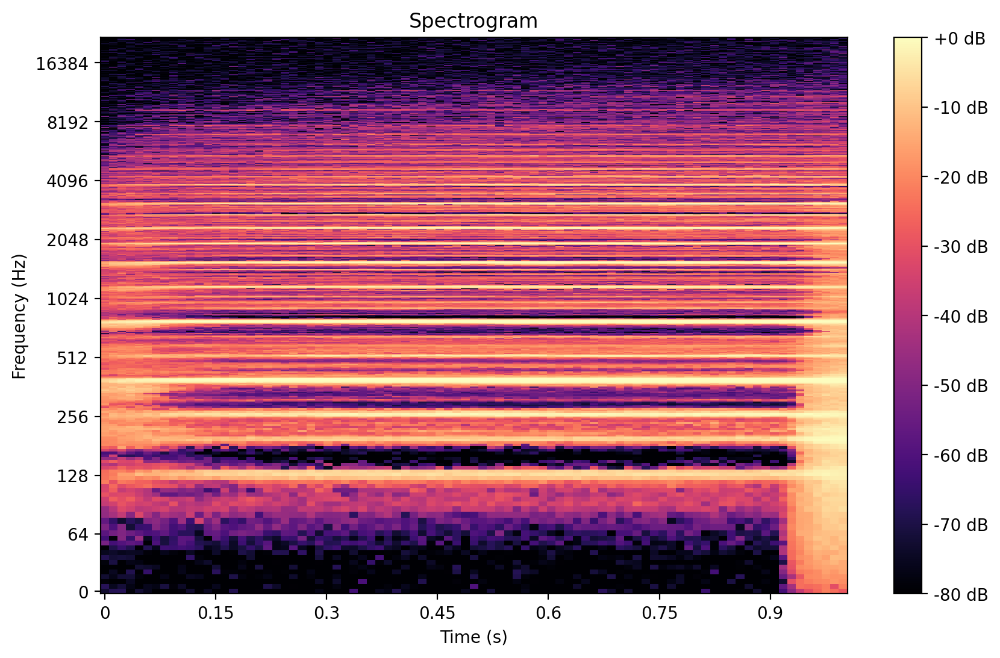

(87,)
[0.00000000e+00 5.99201807e-14 1.11099162e-12 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


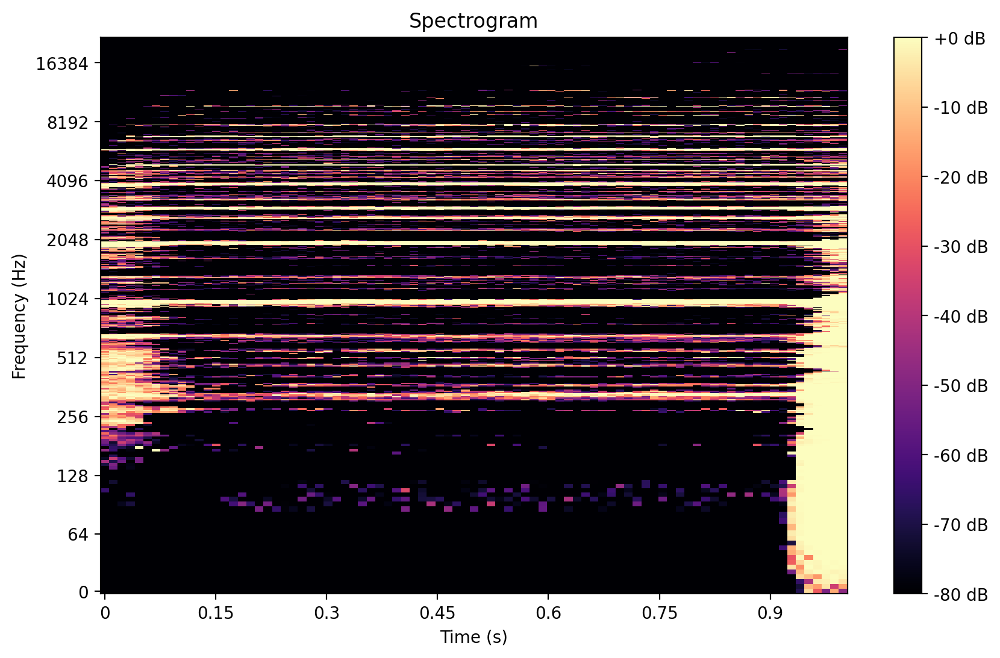

(87,)
[ 0.00000000e+00 -5.84537079e-11 -1.30444044e-10 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


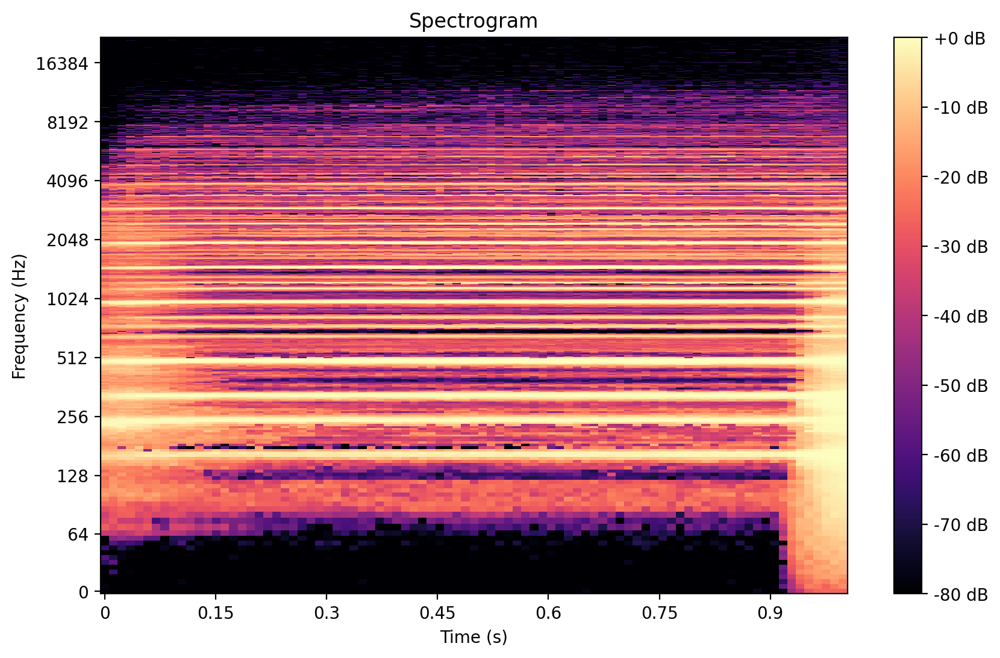

(87,)
[0.00000000e+00 1.50251793e-11 8.70901995e-11 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


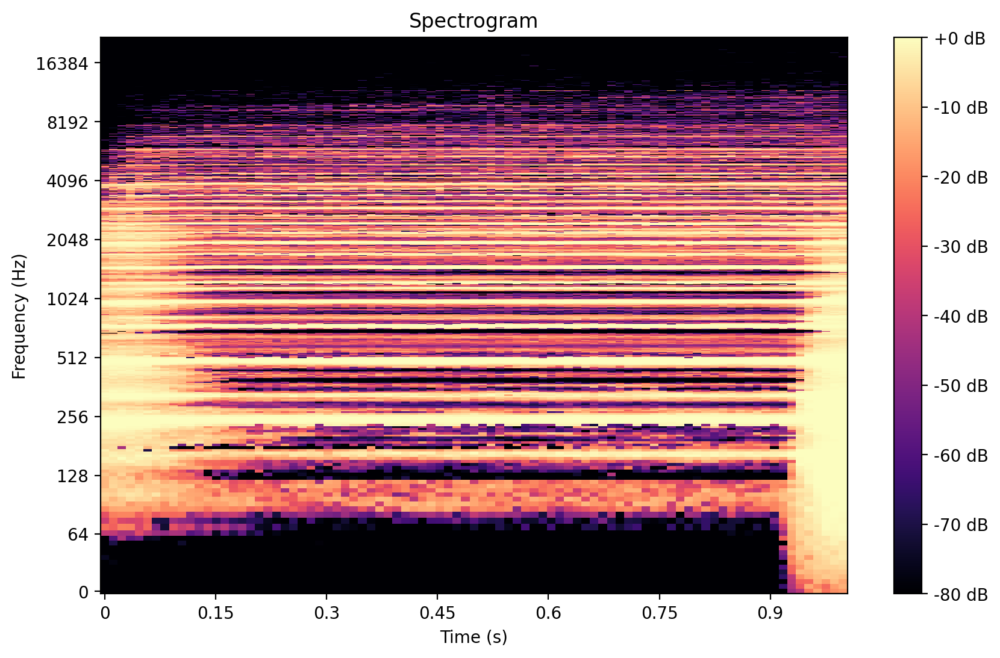

(87,)
[0.00000000e+00 5.72615529e-11 3.03130607e-10 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


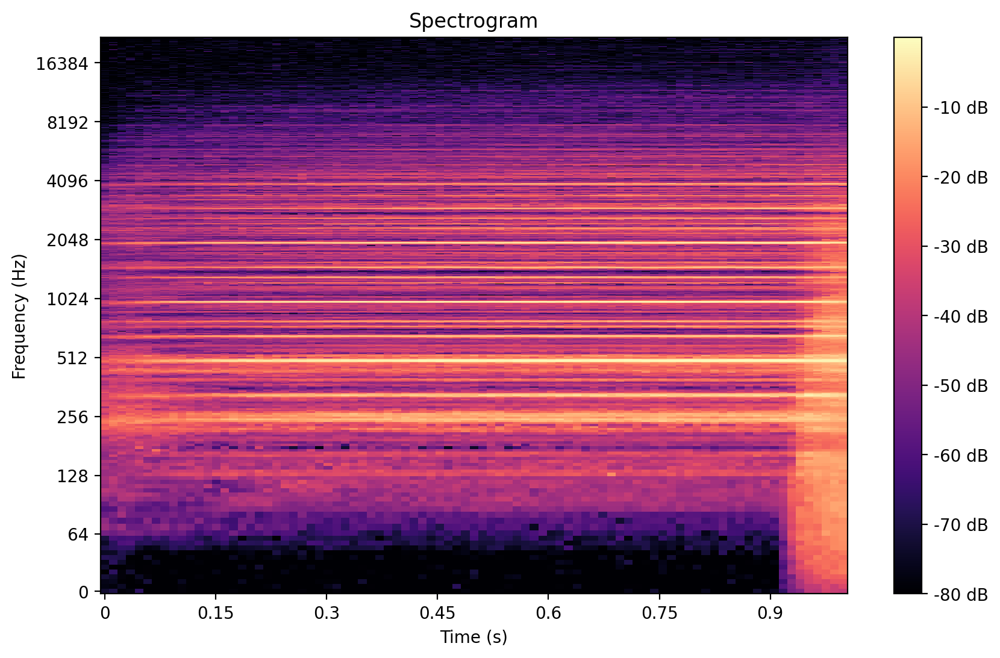

(87,)
[ 0.00000000e+00 -1.41784192e-12 -4.39967263e-12 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


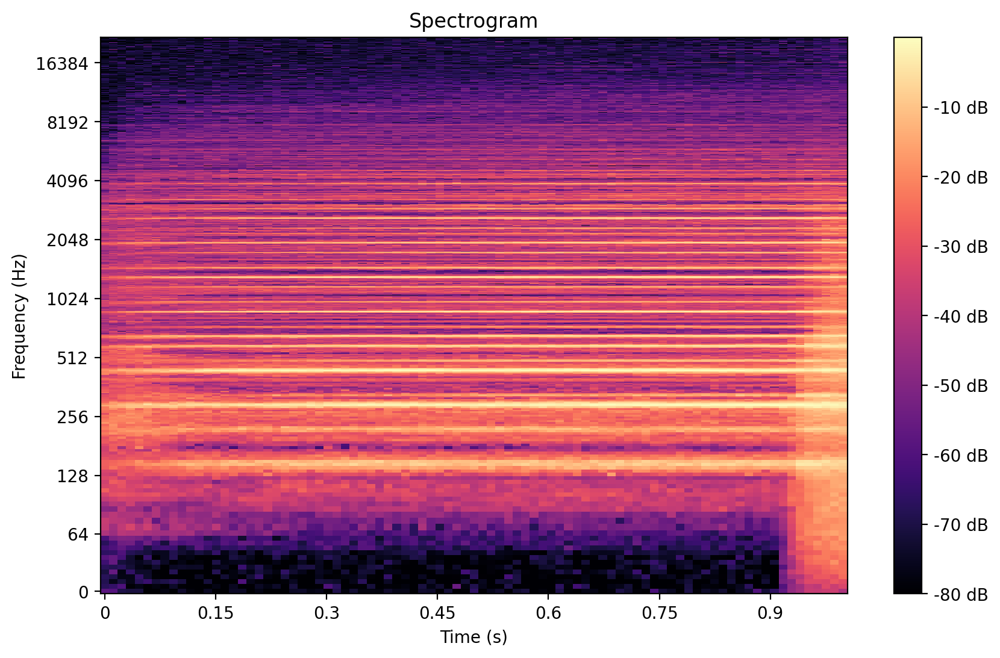

(87,)
[0.00000000e+00 7.67591869e-12 2.81357545e-11 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


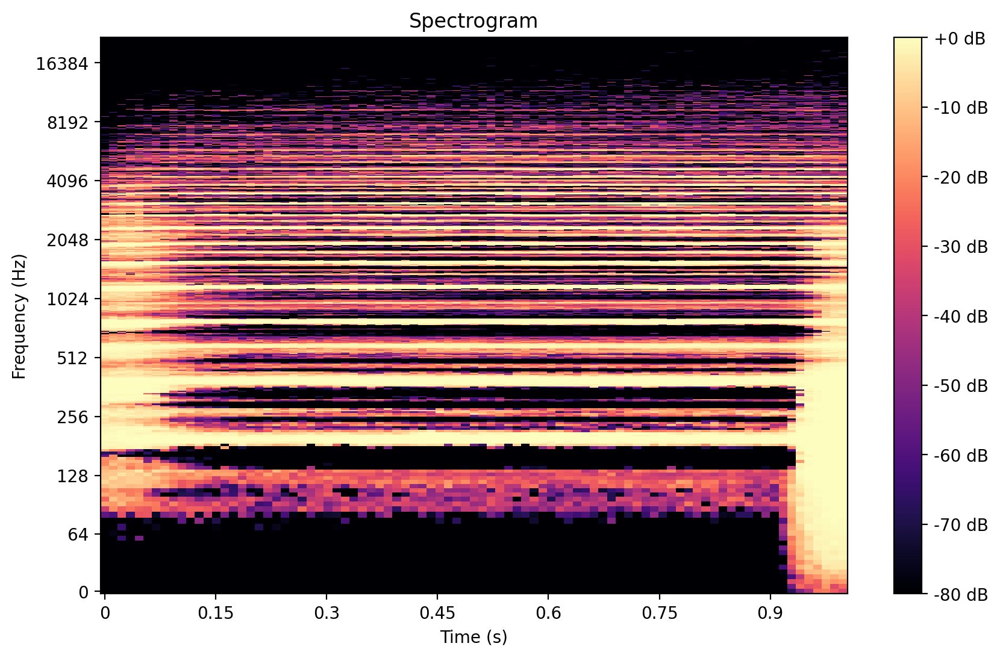

(87,)
[ 0.00000000e+00 -5.90733375e-11 -1.59307313e-10 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


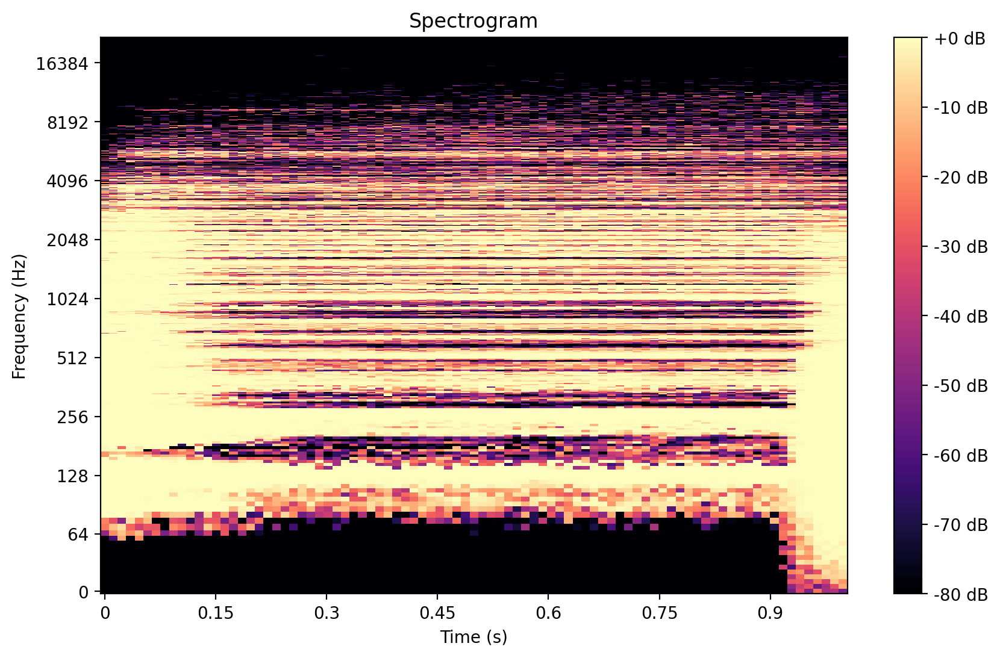

(87,)
[ 0.00000000e+00  3.00295599e-11 -2.02408427e-10 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


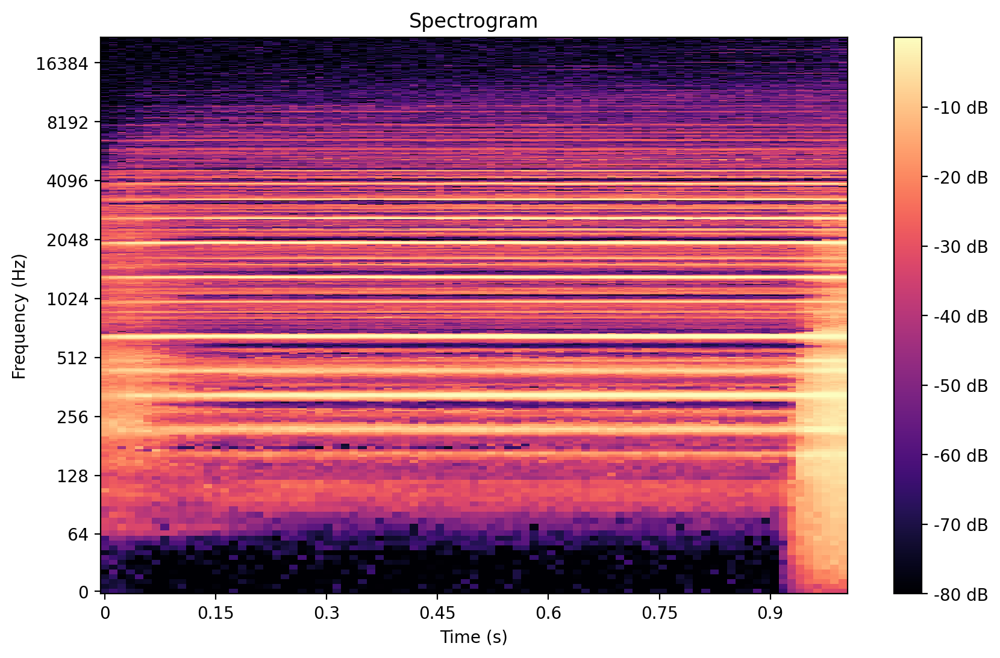

(87,)
[ 0.00000000e+00 -6.25059460e-14 -3.33080929e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


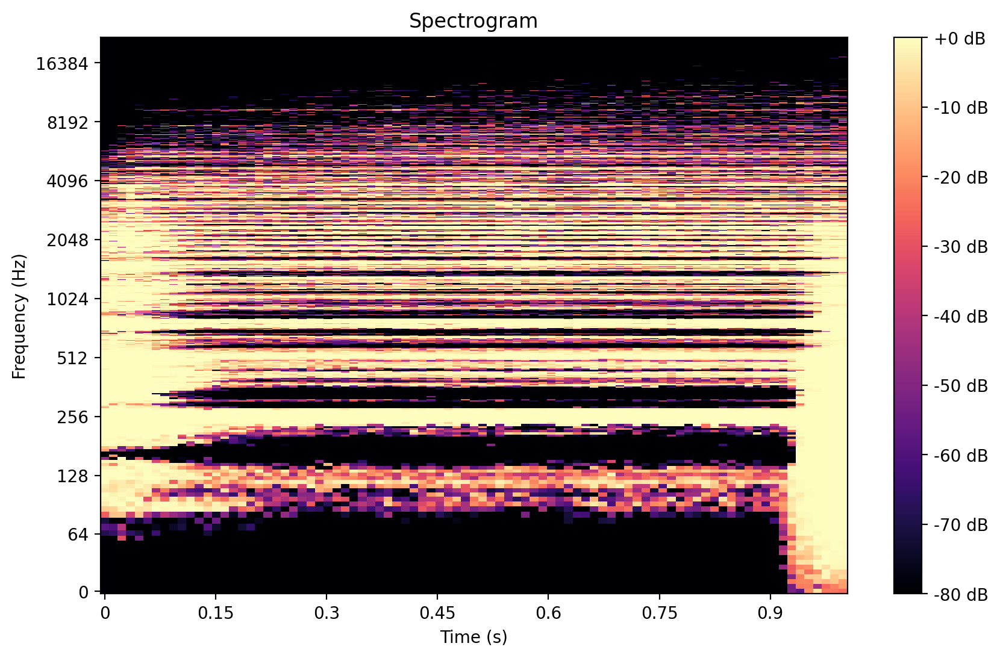

(87,)
[ 0.00000000e+00 -2.38982681e-10 -7.18419925e-10 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


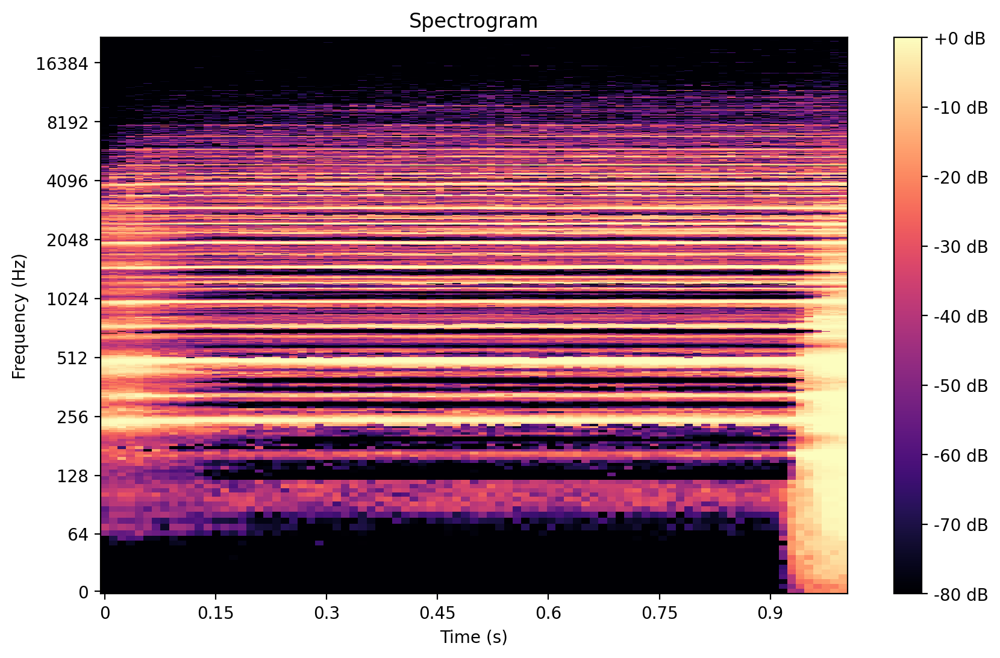

(87,)
[0.00000000e+00 5.24765381e-11 2.28488484e-10 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


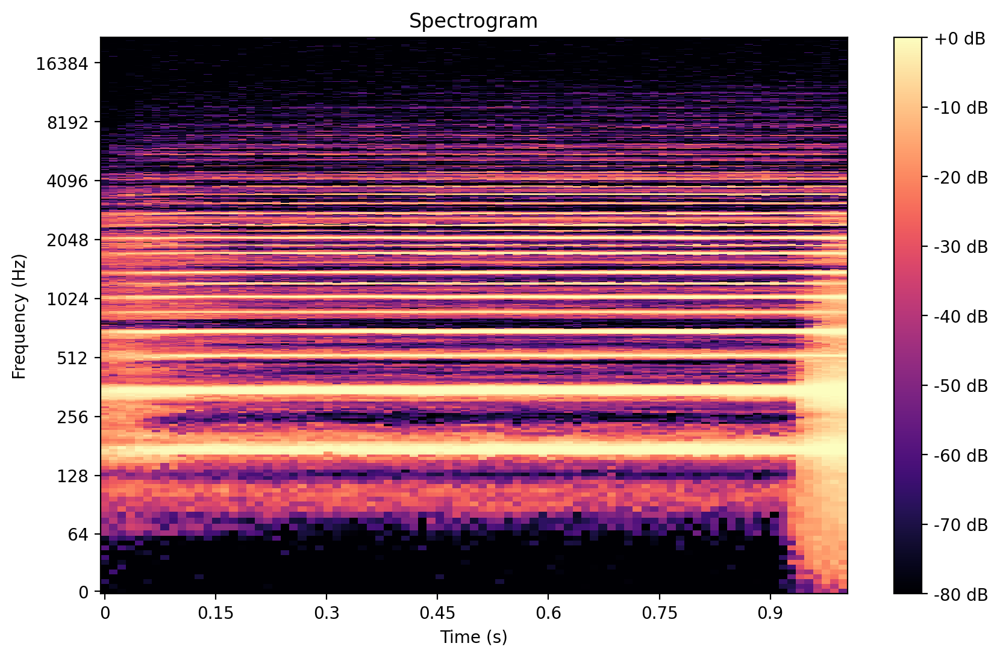

(87,)
[ 0.00000000e+00 -2.27551705e-11 -6.50075818e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


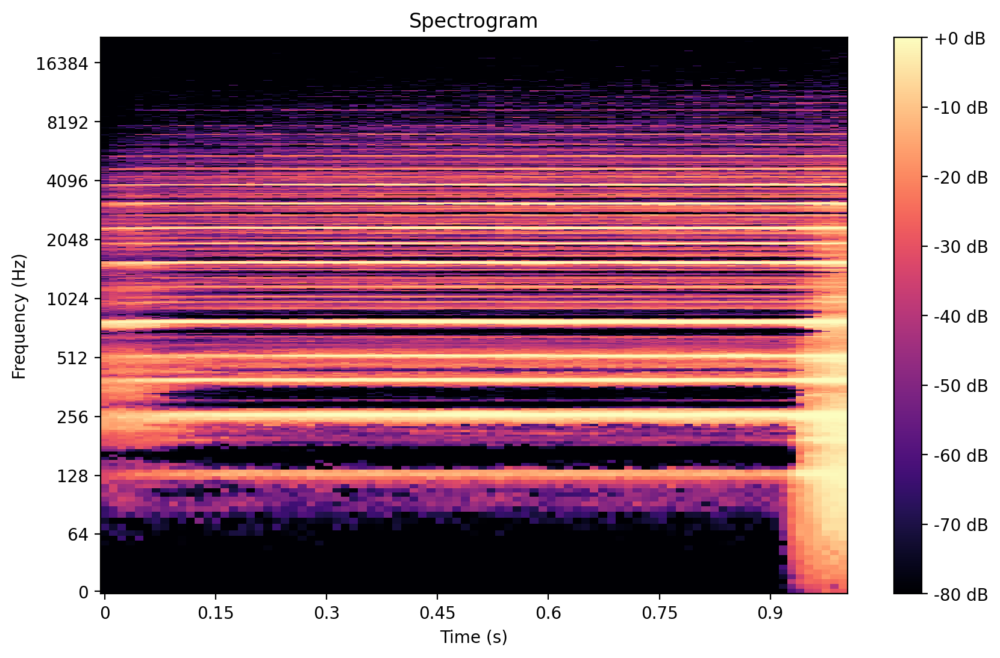

(87,)
[0.00000000e+00 7.51305118e-12 1.22205546e-11 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


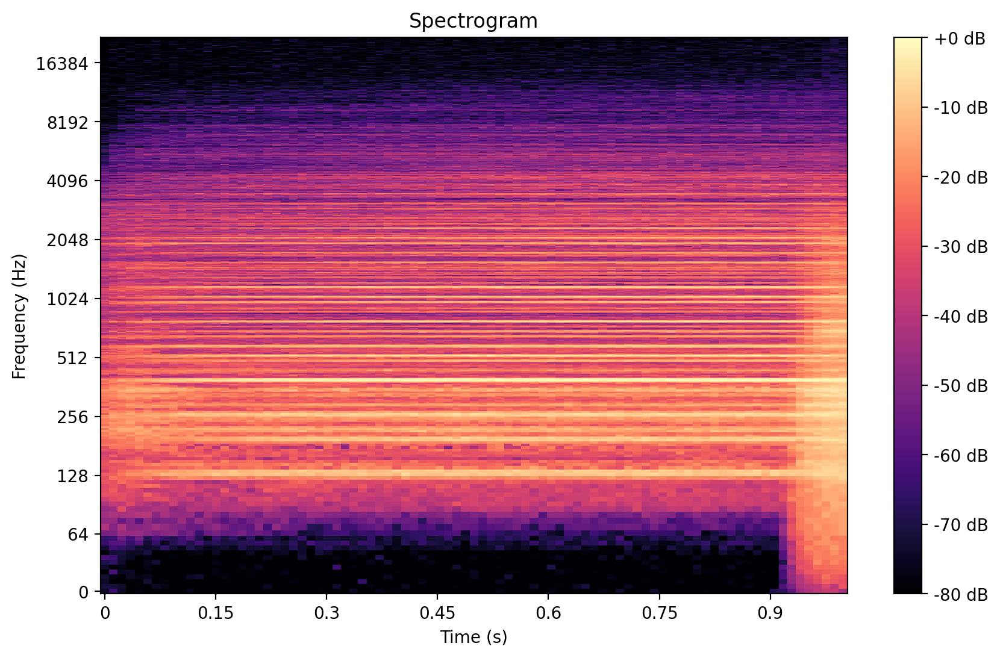

(87,)
[ 0.00000000e+00 -7.55834583e-12 -2.69472444e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


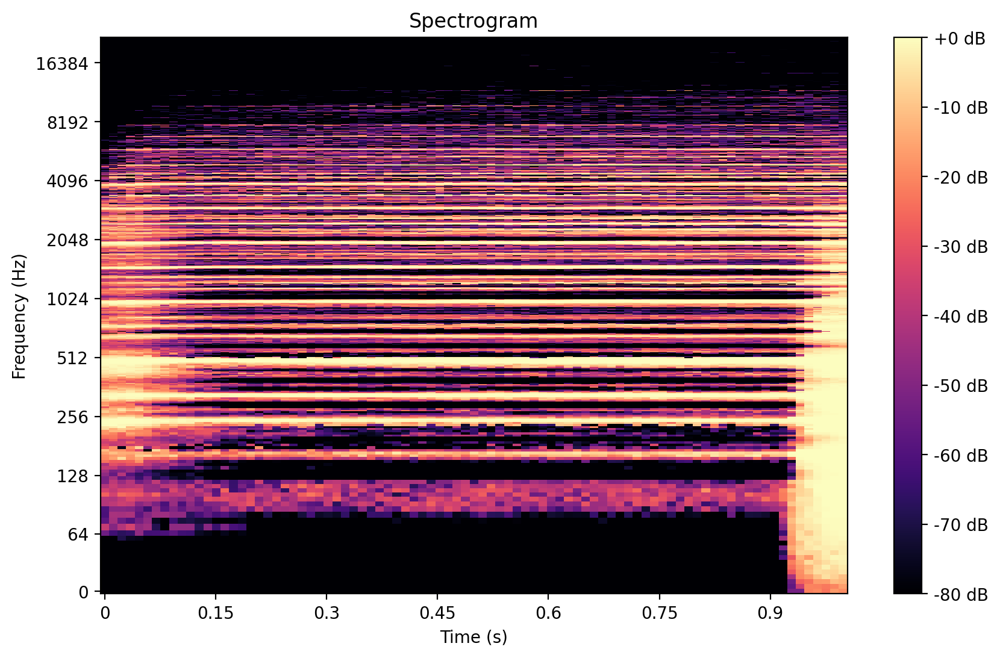

(87,)
[ 0.00000000e+00 -4.75384416e-11 -1.16265708e-10 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


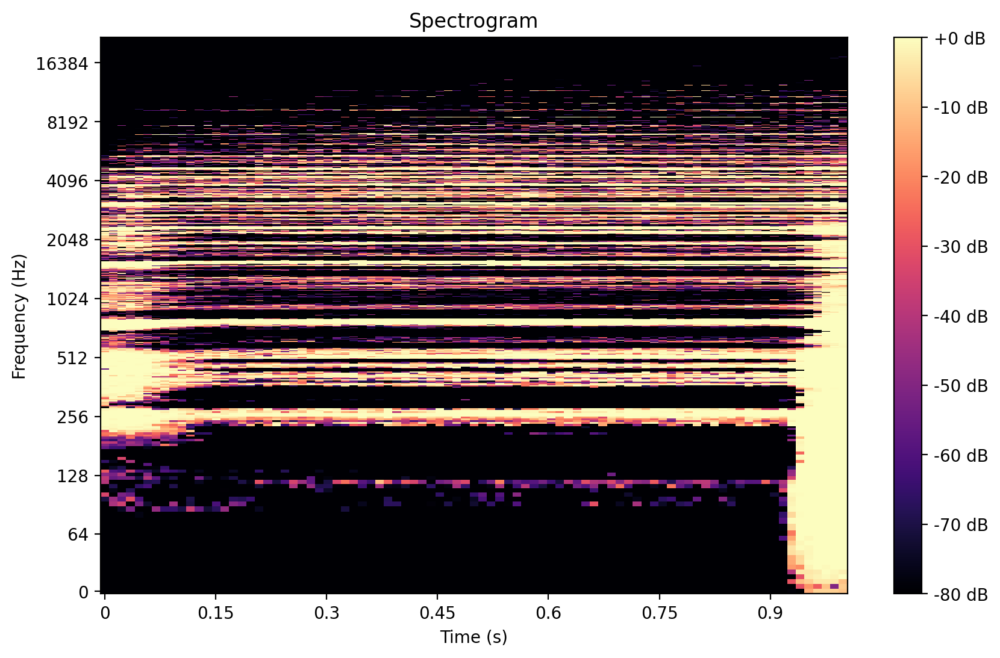

(87,)
[0.00000000e+00 4.06459245e-10 1.40432892e-09 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


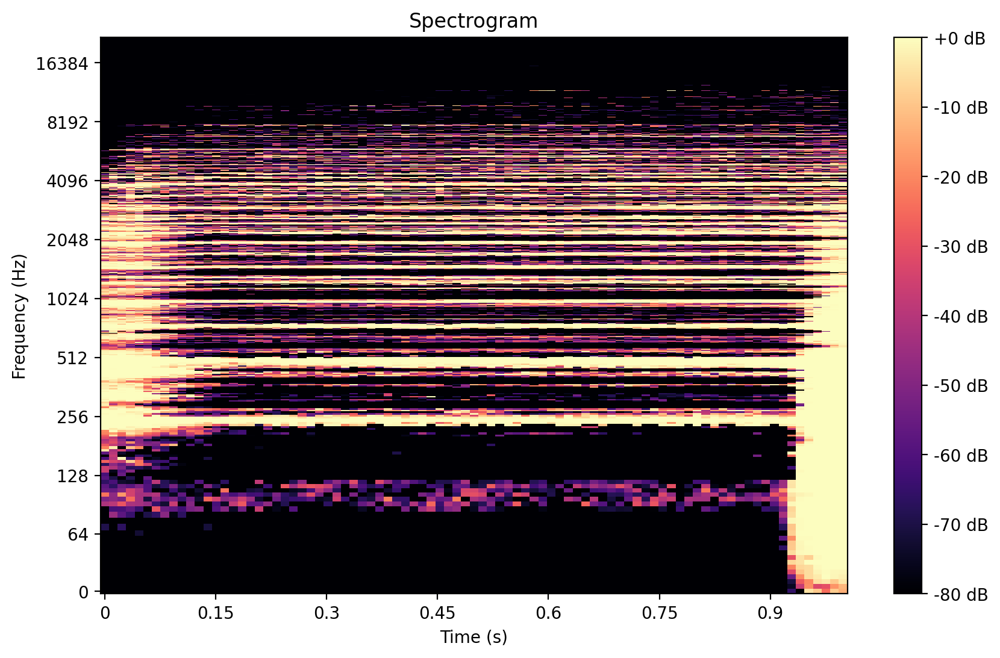

(87,)
[ 0.00000000e+00 -1.16203766e-11 -3.59709448e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


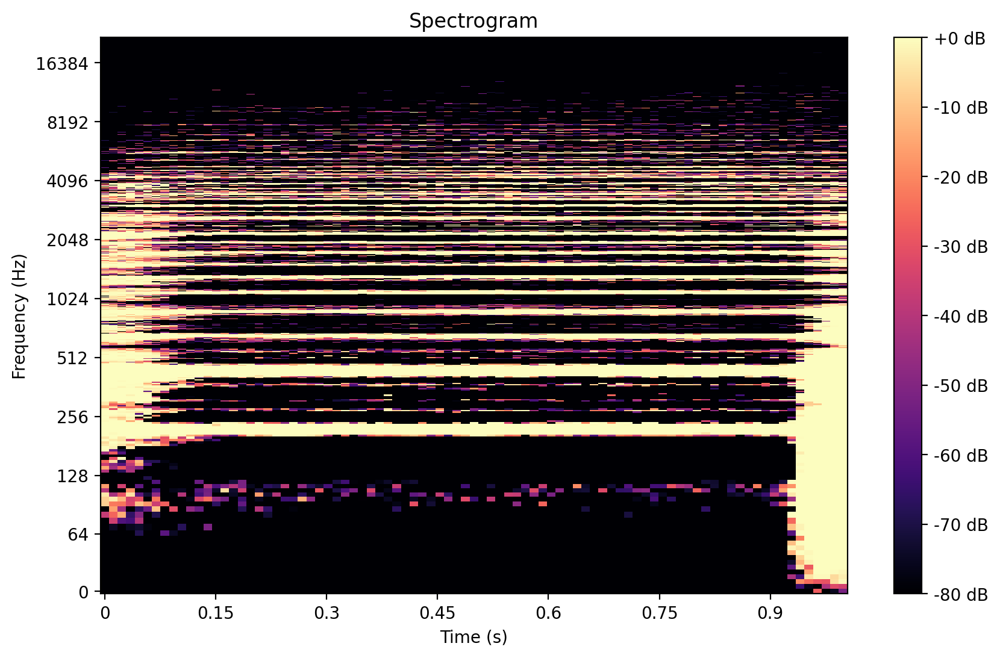

(87,)
[ 0.00000000e+00 -7.30706959e-11  3.74455443e-11 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


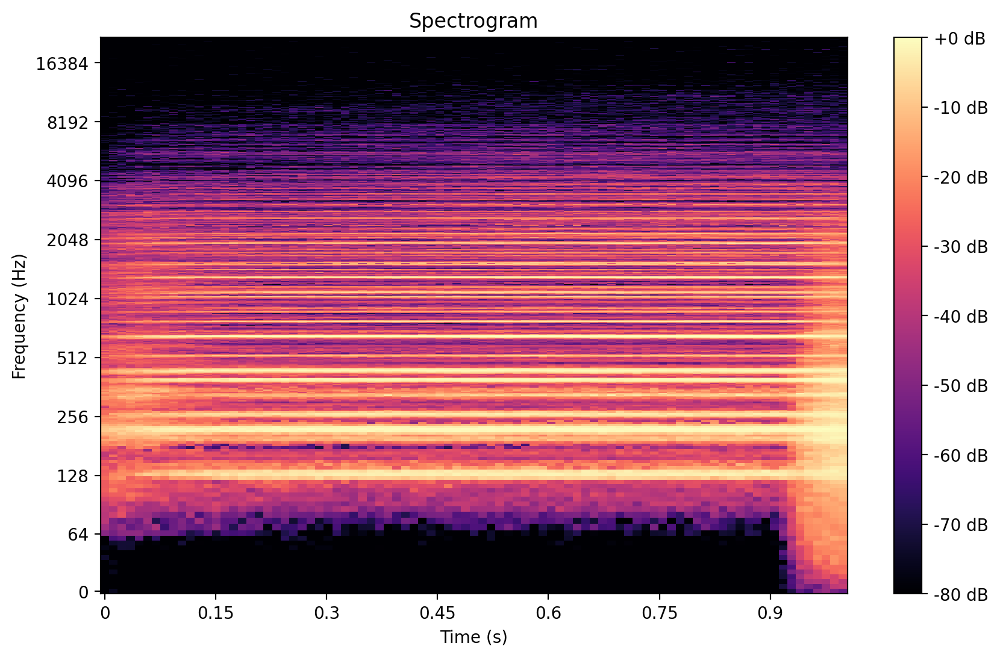

(87,)
[0.00000000e+00 4.38601248e-12 2.04633192e-11 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
recon_batch: torch.Size([1, 356439])
spec prev reshape: (356439,)
spec reshape: (4097, 87)
spec to plot: (4097, 87)


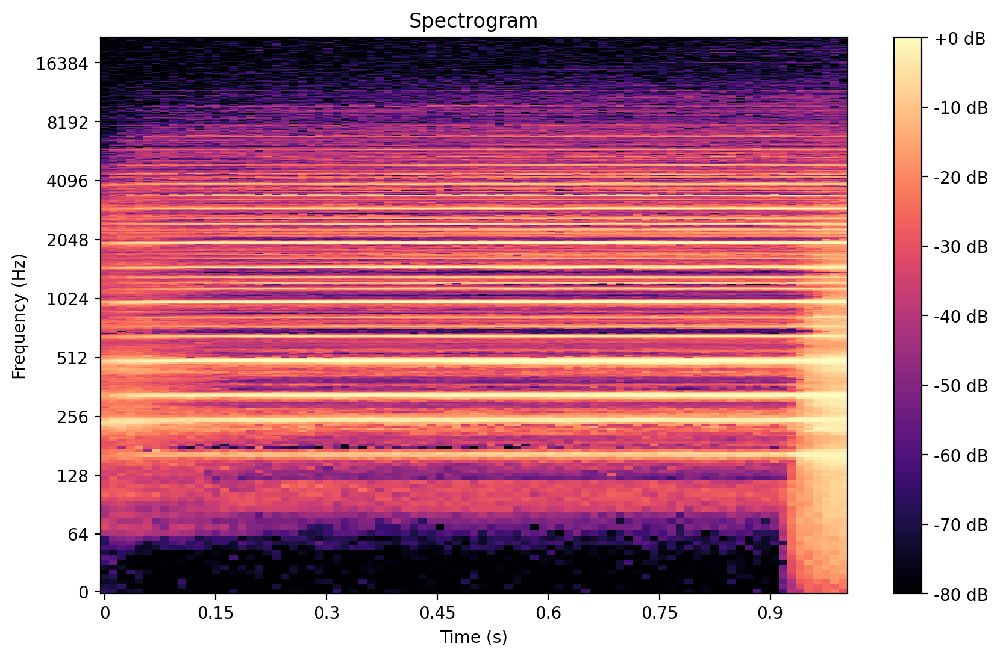

(87,)


KeyboardInterrupt: 

In [46]:
epochs = 15
class_size=4
for epoch in range(1, epochs + 1):
    #c = torch.eye(431,7).cuda()
    test(epoch,val_dl,lf='mse')

torch.Size([1, 356439])
[1, 0, 0, 0]
(4097, 87)


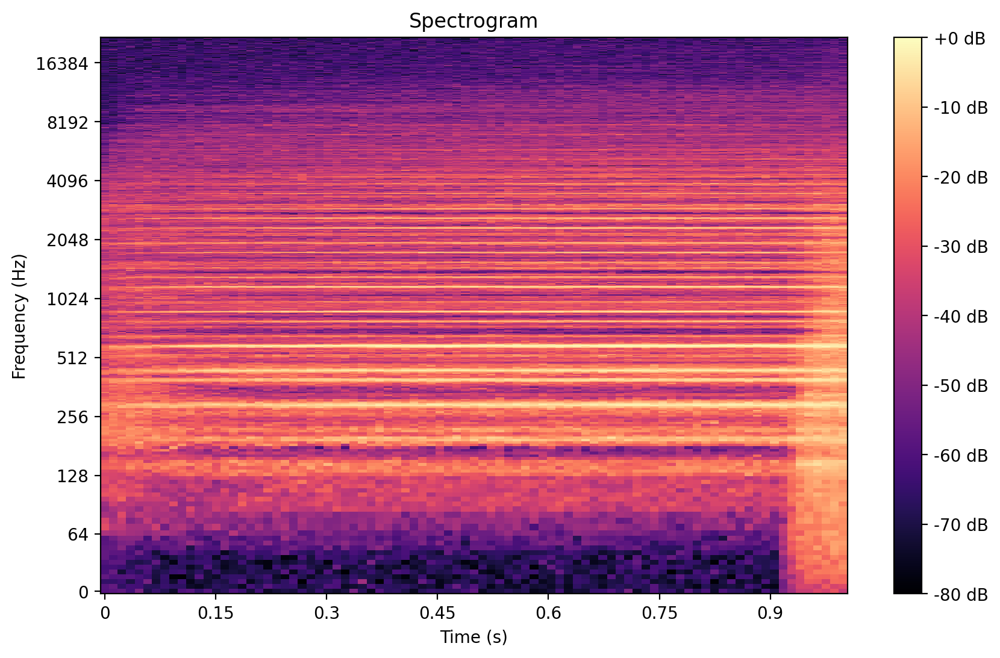

torch.Size([1, 356439])
[0, 1, 0, 0]
(4097, 87)


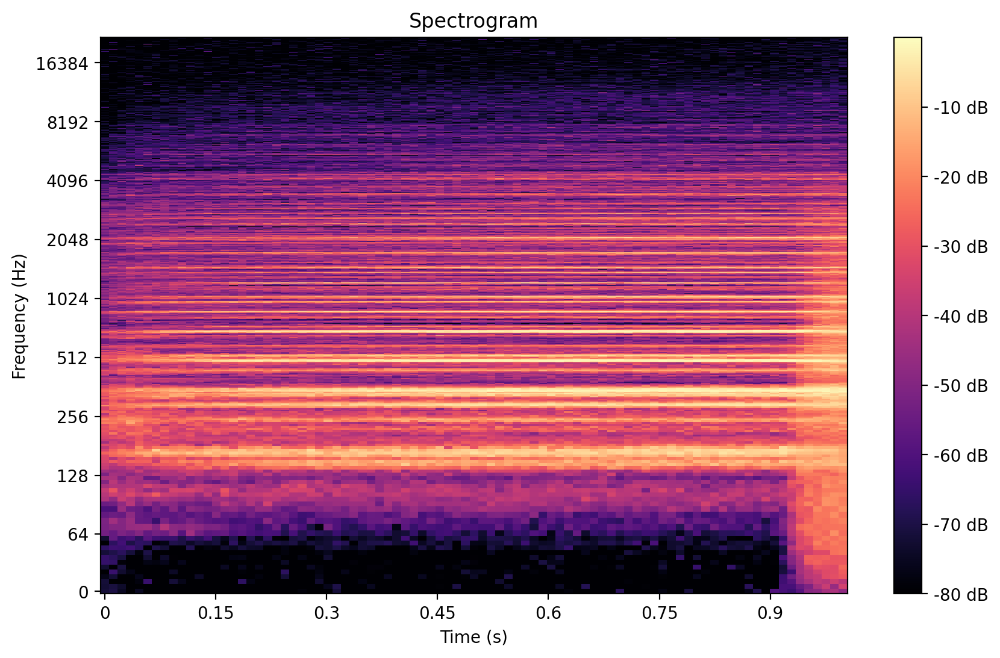

torch.Size([1, 356439])
[0, 0, 1, 0]
(4097, 87)


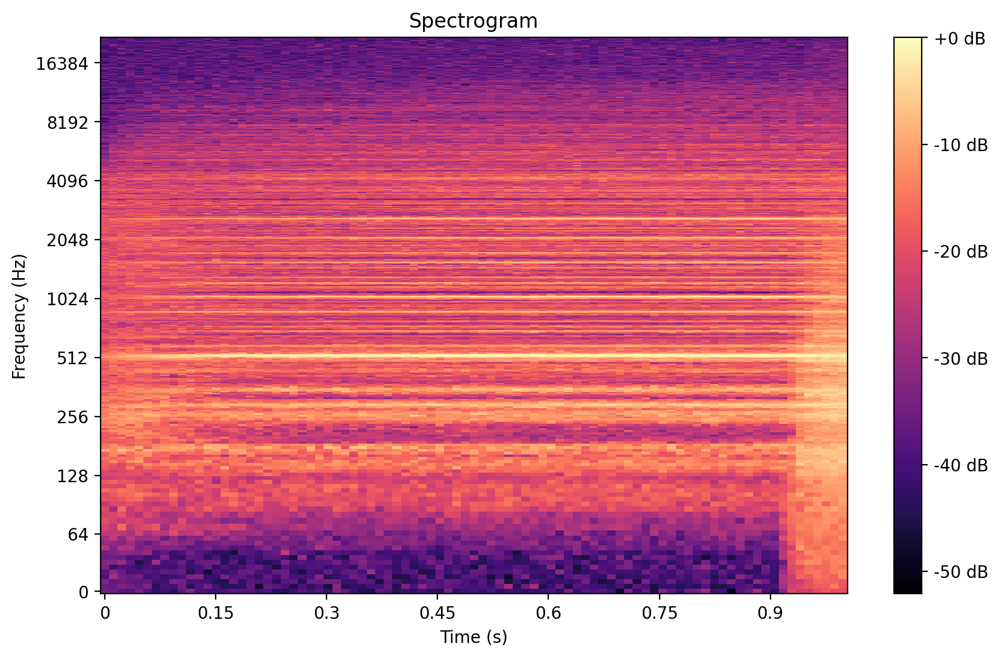

torch.Size([1, 356439])
[0, 0, 0, 1]
(4097, 87)


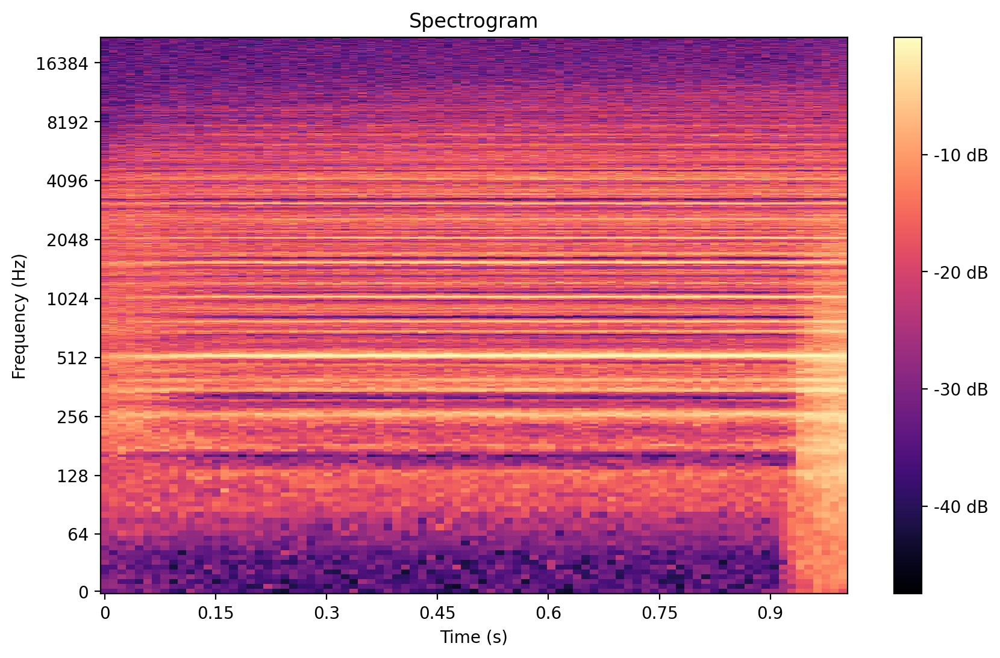

torch.Size([1, 356439])
[1, 0, 1, 0]
(4097, 87)


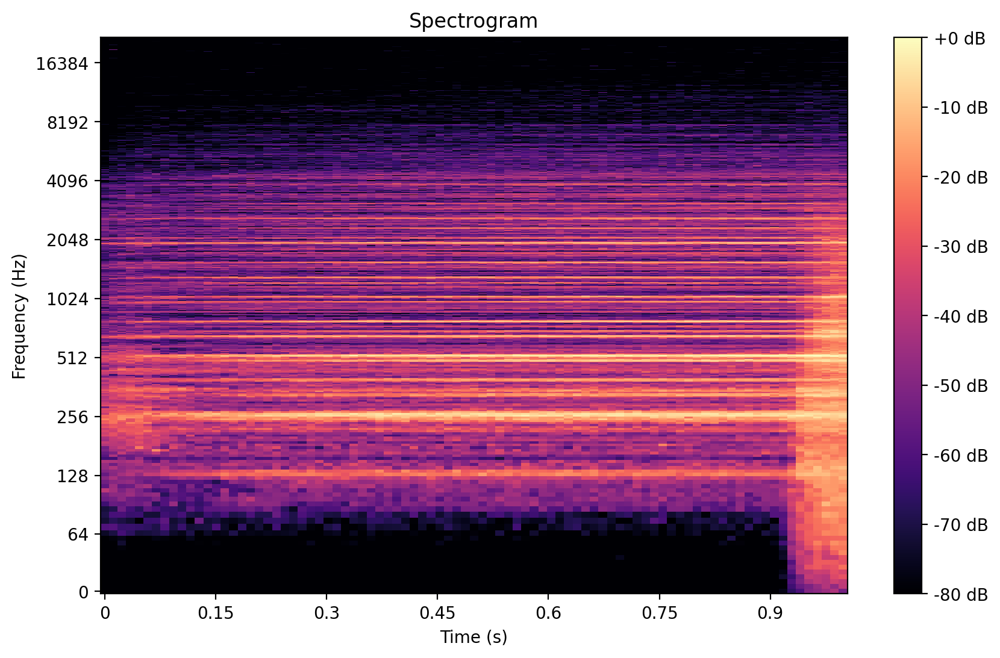

In [47]:
# Use this to generate new spectrograms

instances = [[1,0,0,0],[0,1,0,0],[0,0,1,0],[0,0,0,1],[1,0,1,0]]

for instance in instances:
    with torch.no_grad():

        c = torch.tensor(instance).to(device)

        num_samples = 1  # Number of samples to generate
        latent_size = latent_dim  # Size of the latent space
        
        # Sample from latent space
        #sample = torch.randn(num_samples, latent_size).to(device)
        z = torch.randn(num_samples, latent_dim).to(device)
        # Decode samples
        recon_batch = model.decode(z, c).cpu() 

        print(recon_batch.shape)
        #torch.Size([1, 1025, 259])
    #    spec = recon_batch.view(batch_size, 1, 1025, 431).squeeze().cpu().numpy()

        spec = recon_batch.view(batch_size, 1, 4097, 87).squeeze().cpu().numpy()

        #spec = recon_batch.view(batch_size, 1, 1025, 259).squeeze().cpu().numpy()
        
        print(instance)
        print(spec.shape)

        #noisy
        AudioUtil.plot_spectrogram(spec)

        #x_rec, rmse = reconstruct_signal_griffin_lim(spec.T, 2048, 512, 30)            
        x_rec, rmse = reconstruct_signal_griffin_lim(spec.T, 8192, 512, 30)            

        sf.write(f'./generated/h300_mse_test_gen_{str(instance)}.wav', x_rec, 44100)
        
        #sf.write(f'./generated/mse_test_gen_{str(instance)}.wav', x_rec, 44100)

        
        
        # Estimate the noise spectrum

    """
        threshold = 0.15
        spec[spec < threshold] = threshold

        AudioUtil.plot_spectrogram(spec)


        x_rec, rmse = reconstruct_signal_griffin_lim(spec.T, 2048, 512, 30)            

        sf.write(f'./generated_27/test_gen_fixed_denoised.wav', x_rec, 44100)
    """


In [ ]:
# Parameters
duration = 5.0  # Duration of the note in seconds
sampling_rate = 44100  # Sampling rate in Hz (typical for audio)
frequency = 440  # Frequency of the note in Hz (A4 in this case)

# Generate time array
t = np.linspace(0, duration, int(sampling_rate * duration), endpoint=False)

# Generate sine wave for the note
note = np.sin(2 * np.pi * frequency * t)

# Compute the STFT spectrogram
n_fft = 2048
hop_length = 512
spectrogram = np.abs(librosa.stft(note, n_fft=n_fft, hop_length=hop_length))

print(spectrogram.shape)

# Adjust the shape to (4097, 20)
spectrogram_sample = spectrogram[:4097, :20]


In [ ]:
from IPython.display import Audio

# Assuming 'note' is your generated audio signal
Audio(data=note, rate=sampling_rate)

In [ ]:
for epoch in range(1, epochs + 1):
#   train(epoch)
#    test(epoch)
    with torch.no_grad():
        
        #c = torch.eye(1, 4).to(device)
        instance = [0,0,1,0]
        c = torch.tensor(instance).to(device)
        #print(c[0])

        #sample = torch.randn(4097, latent_dim).to(device)

        spectrogram_sample = torch.tensor(spectrogram, dtype=torch.float32).to(device)
        
        #print(sample.shape)
        sample = model.decode(spectrogram_sample, c).cpu()

        #AudioUtil.plot_spectrogram(sample)
            
            #x_rec, rmse = reconstruct_signal_griffin_lim(sample.T, 8192, 512, 30)            

        x_rec, rmse = reconstruct_signal_griffin_lim(sample.T, 2048, 512, 30)            

        sf.write(f'./generated/test_gen_note.wav', x_rec, 44100)
        break


        #save_image(sample.view(10, 1, 28, 28),
        #           'sample_' + str(f"{epoch:02}") + '.png')

In [ ]:

def griffin_lim(magnitude_spectrogram, iterations=30, n_fft=1024, hop_length=None, win_length=None, length=None):
    """
    Implements the Griffin-Lim algorithm to estimate the phase given only the magnitude
    of the Short-Time Fourier Transform (STFT).

    Args:
    magnitude_spectrogram (torch.Tensor): Magnitude spectrogram
    [..]
    Returns:
    torch.Tensor: Reconstructed time-domain signal
    """

    # Randomly initialize
    phase = torch.exp(2j * torch.pi * torch.rand_like(magnitude_spectrogram))
    complex_spectrogram = magnitude_spectrogram * phase

    # Window function for the STFT/ISTFT
    window = torch.hann_window(win_length)

    for _ in range(iterations):
        # Inverse STFT
        signal = torch.istft(complex_spectrogram, n_fft=n_fft, hop_length=hop_length, win_length=win_length, window=window, length=length)

        # Re-calculate STFT with return_complex=True
        recomplex_spectrogram = torch.stft(signal, n_fft=n_fft, hop_length=hop_length, win_length=win_length, window=window, return_complex=True)

        # Update only the phase
        _, phase = torch.abs(recomplex_spectrogram), torch.angle(recomplex_spectrogram)
        complex_spectrogram = magnitude_spectrogram * torch.exp(1j * phase)

    # Final iSTFT to get the time domain signal
    signal = torch.istft(complex_spectrogram, n_fft=n_fft, hop_length=hop_length, win_length=win_length, window=window, length=length)
    
    return signal

In [ ]:
#model_scripted = torch.jit.script(model) # Export to TorchScript
#model_scripted.save('CVAE_string_l1.pt') # Save

#torch.save(model.state_dict(), './CVAE_string_l1weitghts.pth')

#VAE doesn't work
#VAE_org works

In [ ]:
#model = torch.jit.load('CVAE_string_1s.pt')
#model.eval()

In [ ]:
for i, (spectrogram, labels) in enumerate(train_dl):

    float32_tensor = spectrogram.to(dtype=torch.float32)

    data, labels = float32_tensor.to(device),labels.to(device)
    labels = one_hot(labels, class_size) # 
    
    z = model.encode(data,labels[0])
    z = z.to('cpu').detach().numpy()
    plt.scatter(z[:, 0], z[:, 1], c=label, cmap='tab10')
    if i > batch_size:
        plt.colorbar()
        break

In [ ]:
def generate_from_cvae(sample_num: int, latent_dim: int, label: int):
    # Load vae model
    #cvae = CVAE(784, 10, 10)
    #model.load_state_dict(torch.load("./CVAE_string_epc100_L1loss_weights.pth"))

    print(model)
    
    #utils.load_model(model, "./CVAE_string_epc100_L1loss_weights.pth")

    # sample from the latent space and concat label that you want to generate
    z = torch.randn(sample_num, latent_dim).to(device)


    print(z.shape)


    #labels = torch.full(size=(sample_num, 1), fill_value=label, dtype=torch.int64)
    
    #y = one_hot(labels, 4)

    c = [0,1,0,0]
    y = torch.tensor(c).to(device)

    #print(y)

    recon = model.decode(z, y).detach().cpu()

    spec = recon.squeeze().cpu().numpy()

    AudioUtil.plot_spectrogram(spec)

    x_rec, rmse = reconstruct_signal_griffin_lim(spec.T, 8192, 512, 30)            

    sf.write(f'./generated/test_gen.wav', x_rec, 44100)




generate_from_cvae(sample_num=4097, latent_dim=latent_dim, label=1)

#AudioUtil.plot_spectrogram(recon)
